In [1]:
# Adapted from https://github.com/LeslyLopezFang/Dplus/blob/main/supp_analyses/lesly_reviews_round3_v_responses.ipynb
import numpy as np
import pandas as pd
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from matplotlib import pyplot as plt

In [2]:
# Helper variables and functions.

alphas = np.arange(0.01, 1.01, 0.01)

xs = np.arange(0.01, 1.01, 0.01)
x_ticks = np.array([
    0.01, 0.1 , 0.2 , 0.3 ,
    0.4 , 0.5 , 0.6 , 0.7 ,
    0.8 , 0.9 , 1,
])

def load_null(fileName):
    dist = []
    for line in open(fileName, 'r'):
        dist.append(float(line))
    return np.array(dist)

def load_performance(pvals, replicatePath):
    performance_dicc = {}
    for stat in ['d', 'dplus', 'dstar']:
        # For every p-value.
        for pval in pvals:
            # For every window threshold.
            for wind_threshold in [0.05, 0.1, 0.25]:
                # Intialize the column key.
                col_key = f'{stat}-{round(pval, 2)}-{wind_threshold}'
                # Intialize the sub-dictionary.
                performance_dicc[col_key]= {}
                # Intialize the performance counters.
                performance_dicc[col_key]['TP'] = 0
                performance_dicc[col_key]['TN'] = 0
                performance_dicc[col_key]['FP'] = 0
                performance_dicc[col_key]['FN'] = 0
    for rep in range(1, 101):
        performance_df = pd.read_csv(
            f'{replicatePath}/rep{rep}_performance.csv',
        )
        # For every column key.
        for col_key in performance_dicc:
            # For every performance outcome.
            for outcome in performance_dicc[col_key]:
                # Update the reults.
                performance_dicc[col_key][outcome] += (performance_df[col_key].values == outcome).sum()
    return performance_dicc

def calc_performance_metrics(performance_dicc):
    # Intialize a dataframe dictionary.
    df_dicc = {
        'wind_thresh': [], 'pval': [], 'stat': [],
        'tp': [], 'tn': [], 'fp': [], 'fn': [],
        'precision': [], 'recall': [],
    }
    
    for col_key in performance_dicc:
        # Unpack the column key.
        stat, pval, wind_threshold = col_key.split('-')
        # Extract the performance outcomes.
        tp = performance_dicc[col_key]['TP']
        tn = performance_dicc[col_key]['TN']
        fp = performance_dicc[col_key]['FP']
        fn = performance_dicc[col_key]['FN']
        # Compute precision.
        precision = tp / (tp + fp)
        # Compute recall.
        recall = tp / (tp + fn)
        # Update the dictionary.
        df_dicc['wind_thresh'].append(float(wind_threshold))
        df_dicc['pval'].append(float(pval))
        df_dicc['stat'].append(stat)
        df_dicc['tp'].append(tp)
        df_dicc['tn'].append(tn)
        df_dicc['fp'].append(fp)
        df_dicc['fn'].append(fn)
        df_dicc['precision'].append(precision)
        df_dicc['recall'].append(recall)
        
    return pd.DataFrame(data=df_dicc)

def print_precision_recall(df):
    cond_wind = df['wind_thresh'] == 0.1
    cond_d = df['stat'] == 'd'
    cond_dplus = df['stat'] == 'dplus'
    cond_dstar = df['stat'] == 'dstar'
    print("alpha\tD\t\tD+\t\tD*")
    for i,a in enumerate([0.01, 0.02, 0.03, 0.04, 0.05]):
        print(f"{a}\t{round(df[cond_wind & cond_d]['precision'].values[i], 4)}/{round(df[cond_wind & cond_d]['recall'].values[i], 4)}\t{round(df[cond_wind & cond_dplus]['precision'].values[i], 4)}/{round(df[cond_wind & cond_dplus]['recall'].values[i], 4)}\t{round(df[cond_wind & cond_dstar]['precision'].values[i], 4)}/{round(df[cond_wind & cond_dstar]['recall'].values[i], 4)}")
    print()

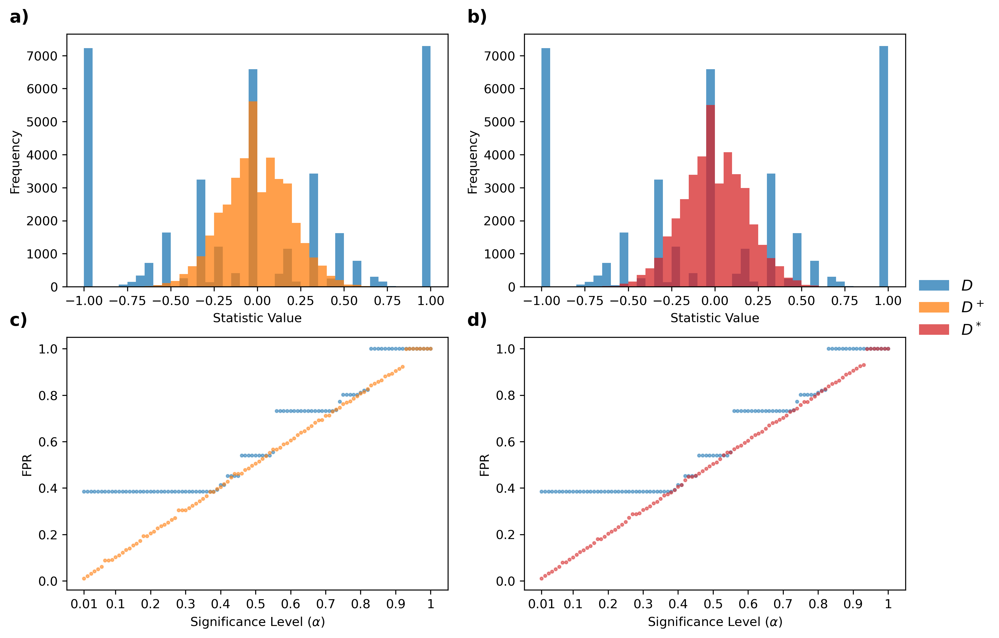

D: Mean= 0.001827509359318164 Std. Dev.= 0.678691761150157
D+: Mean= 0.000622705 Std. Dev.= 0.18943854331988852
D*: Mean= 0.0006543515500000001 Std. Dev.= 0.18383633278791983


In [4]:
x_fpr = np.array([
    0.01, 0.1 , 0.2 , 0.3 ,
    0.4 , 0.5 , 0.6 , 0.7 ,
    0.8 , 0.9 , 1,
])
dNull = load_null('results/resultsN1NoIntro/d_null.txt')
dplusNull = load_null('results/resultsN1NoIntro/dplus_null.txt')
dstarNull = load_null('results/resultsN1NoIntro/dstar_null.txt')
fig, axes = plt.subplots(
    2, 2, figsize=(12, 8), dpi=300.0,
    sharex=False, sharey=False, facecolor='white',
)
axes[0][0].hist(
    dNull, bins=np.arange(-1, 1.05, 0.05),
    histtype='stepfilled', color='tab:blue', alpha=0.75,
)
axes[0][0].hist(
    dplusNull, bins=np.arange(-1, 1.05, 0.05),
    histtype='stepfilled', color='tab:orange', alpha=0.75,
)
axes[0][1].hist(
    dNull, bins=np.arange(-1, 1.05, 0.05),
    histtype='stepfilled', color='tab:blue', alpha=0.75,
)
axes[0][1].hist(
    dstarNull, bins=np.arange(-1, 1.05, 0.05),
    histtype='stepfilled', color='tab:red', alpha=0.75,
)
legend_elements = [
    Patch(facecolor='tab:blue', alpha=0.75, label=r'$D$'),
    Patch(facecolor='tab:orange', alpha=0.75, label=r'$D^+$'),
    Patch(facecolor='tab:red', alpha=0.75, label=r'$D^*$'),
]
fig.legend(
    handles=legend_elements, loc='center left',
    bbox_to_anchor=(0.9, 0.5), frameon=False,
    fontsize=12,
)
axes[0][0].set_xlabel('Statistic Value')
axes[0][0].set_ylabel('Frequency')
axes[0][1].set_xlabel('Statistic Value')
axes[0][1].set_ylabel('Frequency')
dFPR = pd.read_csv('results/resultsN1NoIntro/d_fpr.csv')
dplusFPR = pd.read_csv('results/resultsN1NoIntro/dplus_fpr.csv')
dstarFPR = pd.read_csv('results/resultsN1NoIntro/dstar_fpr.csv')
axes[1][0].scatter(
    alphas, dFPR['fpr'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[1][0].scatter(
    alphas, dplusFPR['fpr'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[1][1].scatter(
    alphas, dFPR['fpr'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[1][1].scatter(
    alphas, dstarFPR['fpr'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)
axes[1][0].set_xticks(x_fpr)
axes[1][0].set_xticklabels([str(int(x)) if x.is_integer() else str(x) for x in x_fpr])
axes[1][0].set_xlabel(r'Significance Level ($\alpha$)')
axes[1][0].set_ylabel('FPR')
axes[1][1].set_xticks(x_fpr)
axes[1][1].set_xticklabels([str(int(x)) if x.is_integer() else str(x) for x in x_fpr])
axes[1][1].set_xlabel(r'Significance Level ($\alpha$)')
axes[1][1].set_ylabel('FPR')
for ax, label in zip(axes.flat, ['a)', 'b)', 'c)', 'd)']):
    ax.text(
        -0.15, 1.1, label,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )
plt.savefig("n1_null.png", dpi=300)
plt.show()
print('D: Mean=', np.mean(dNull), 'Std. Dev.=', np.std(dNull))
print('D+: Mean=', np.mean(dplusNull), 'Std. Dev.=', np.std(dplusNull))
print('D*: Mean=', np.mean(dstarNull), 'Std. Dev.=', np.std(dstarNull))

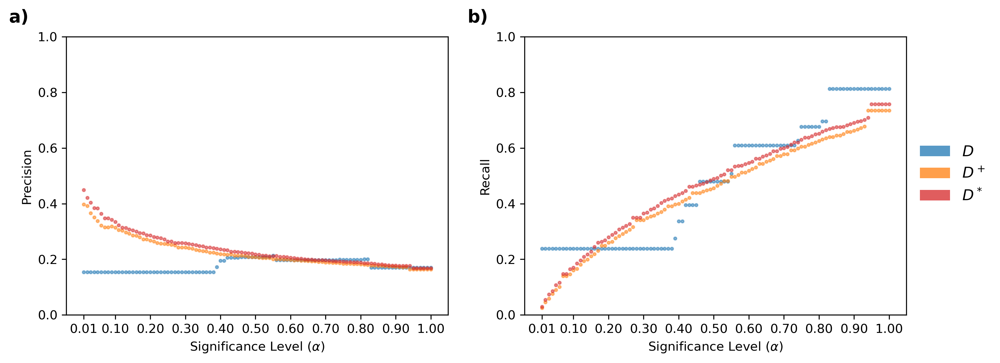

alpha	D		D+		D*
0.01	0.1539/0.2381	0.3971/0.0252	0.4498/0.0297
0.02	0.1539/0.2381	0.3922/0.0457	0.4212/0.0544
0.03	0.1539/0.2381	0.3659/0.0583	0.4038/0.0739
0.04	0.1539/0.2381	0.3511/0.0755	0.3847/0.0862
0.05	0.1539/0.2381	0.3379/0.0899	0.3829/0.1072



In [3]:
# N = 1
performance_results = load_performance(alphas, './results/resultsN1Intro')
performance_df = calc_performance_metrics(performance_results)

fig, axes = plt.subplots(
    1, 2, figsize=(12, 4), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

cond_wind = performance_df['wind_thresh'] == 0.1
cond_d = performance_df['stat'] == 'd'
cond_dplus = performance_df['stat'] == 'dplus'
cond_dstar = performance_df['stat'] == 'dstar'
axes[0].scatter(
    xs, performance_df[cond_wind & cond_d]['precision'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[0].scatter(
    xs, performance_df[cond_wind & cond_dplus]['precision'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[0].scatter(
    xs, performance_df[cond_wind & cond_dstar]['precision'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)

axes[1].scatter(
    xs, performance_df[cond_wind & cond_d]['recall'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[1].scatter(
    xs, performance_df[cond_wind & cond_dplus]['recall'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[1].scatter(
    xs, performance_df[cond_wind & cond_dstar]['recall'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)

axes[0].set_ylabel('Precision')
axes[1].set_ylabel('Recall')
axes[0].set_xlabel(r'Significance Level ($\alpha$)')
axes[1].set_xlabel(r'Significance Level ($\alpha$)')
axes[0].set_ylim(0, 1)
axes[1].set_ylim(0, 1)
axes[0].set_xticks(x_ticks)
axes[1].set_xticks(x_ticks)
legend_elements = [
    Patch(facecolor='tab:blue', alpha=0.75, label=r'$D$'),
    Patch(facecolor='tab:orange', alpha=0.75, label=r'$D^+$'),
    Patch(facecolor='tab:red', alpha=0.75, label=r'$D^*$')
]
fig.legend(
    handles=legend_elements, loc='center left',
    bbox_to_anchor=(0.9, 0.5), frameon=False,
    fontsize=12,
)
for ax, label in zip(axes.flat, ['a)', 'b)']):
    ax.text(
        -0.15, 1.1, label,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )
# Show the plot.
plt.savefig("n1.png", dpi=300)
plt.show()
print_precision_recall(performance_df)

In [8]:
# Vary mutation-rate/recombination-rate/admixture-proportion with N = 1.
dfs = []
for i, mu in enumerate(['mu0.75e-8', 'mu1.5e-8', 'mu3e-8']):
    dfs.append([])
    for j, rho in enumerate(['rho0.5e-8', 'rho1e-8', 'rho2e-8']):
        dfs[i].append([])
        for k, f in enumerate(['f3', 'f5', 'f10']):
            performance_results = load_performance(alphas, f"./results/resultsAdmIntro/{mu}/{rho}/{f}")
            performance_df = calc_performance_metrics(performance_results)
            dfs[i][j].append(performance_df)
            print(mu, rho, f)
            print_precision_recall(dfs[i][j][k])

mu0.75e-8 rho0.5e-8 f3
alpha	D		D+		D*
0.01	0.1009/0.6643	0.1237/0.0304	0.127/0.0304
0.02	0.1009/0.6643	0.2638/0.0834	0.2805/0.0937
0.03	0.1009/0.6643	0.2874/0.139	0.2959/0.1603
0.04	0.1009/0.6643	0.2715/0.1752	0.2774/0.19
0.05	0.1009/0.6643	0.249/0.1997	0.24/0.2204

mu0.75e-8 rho0.5e-8 f5
alpha	D		D+		D*
0.01	0.1585/0.6559	0.1608/0.0234	0.1634/0.023
0.02	0.1585/0.6559	0.3657/0.0761	0.3961/0.0876
0.03	0.1585/0.6559	0.3998/0.1304	0.4095/0.1506
0.04	0.1585/0.6559	0.3806/0.1649	0.393/0.1819
0.05	0.1585/0.6559	0.3511/0.1879	0.3503/0.2124

mu0.75e-8 rho0.5e-8 f10
alpha	D		D+		D*
0.01	0.2875/0.6593	0.2928/0.0233	0.2964/0.0227
0.02	0.2875/0.6593	0.5145/0.0664	0.5453/0.0773
0.03	0.2875/0.6593	0.5717/0.1261	0.578/0.1456
0.04	0.2875/0.6593	0.5639/0.163	0.562/0.1711
0.05	0.2875/0.6593	0.5243/0.1857	0.524/0.2154

mu0.75e-8 rho1e-8 f3
alpha	D		D+		D*
0.01	0.0949/0.5502	0.244/0.0385	0.2842/0.045
0.02	0.0949/0.5502	0.2459/0.0813	0.2985/0.0867
0.03	0.0949/0.5502	0.2315/0.1138	0.2476/0.1273
0.04	0.0949

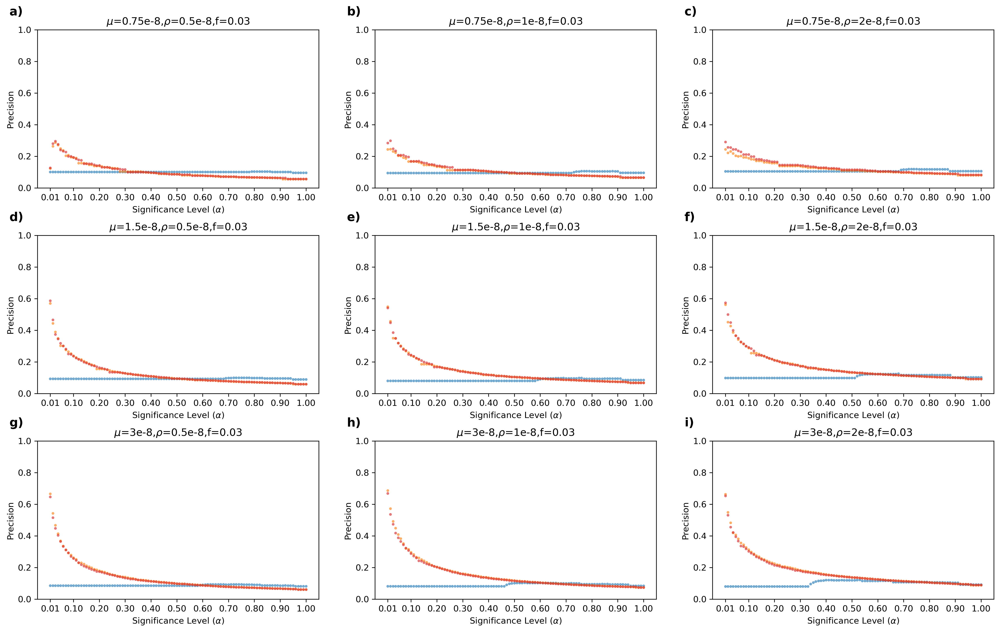

In [9]:
fig, axes = plt.subplots(
    3, 3, figsize=(20, 12), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

f = '0.03'
k = 0
for i, mu in enumerate(['0.75e-8', '1.5e-8', '3e-8']):
    for j, rho in enumerate(['0.5e-8', '1e-8', '2e-8']):
        cond_wind = dfs[i][j][k]['wind_thresh'] == 0.1
        cond_d = dfs[i][j][k]['stat'] == 'd'
        cond_dplus = dfs[i][j][k]['stat'] == 'dplus'
        cond_dstar = dfs[i][j][k]['stat'] == 'dstar'
        axes[i][j].scatter(
            xs, dfs[i][j][k][cond_wind & cond_d]['precision'].values,
            marker='o', s=5, color='tab:blue', alpha=0.5,
        )
        axes[i][j].scatter(
            xs, dfs[i][j][k][cond_wind & cond_dplus]['precision'].values,
            marker='o', s=5, color='tab:orange', alpha=0.5,
        )
        axes[i][j].scatter(
            xs, dfs[i][j][k][cond_wind & cond_dstar]['precision'].values,
            marker='o', s=5, color='tab:red', alpha=0.5,
        )
        axes[i][j].set_title(r"$\mu$={0},$\rho$={1},f={2}".format(mu, rho, f))
        axes[i][j].set_ylabel('Precision')
        axes[i][j].set_xlabel(r'Significance Level ($\alpha$)')
        axes[i][j].set_ylim(0, 1)
        axes[i][j].set_xticks(x_ticks)

for ax, i in zip(axes.flat, ['a)', 'b)', 'c)', 'd)', 'e)', 'f)', 'g)', 'h)', 'i)']):
    ax.text(
        -0.1, 1.15,
        i,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )

fig.subplots_adjust(
    wspace=0.2,  # horizontal space between subplots
    hspace=0.3   # vertical space between subplots
)
    
# Show the plot.
plt.savefig("admix_precision_f3.png", dpi=300)
plt.show()

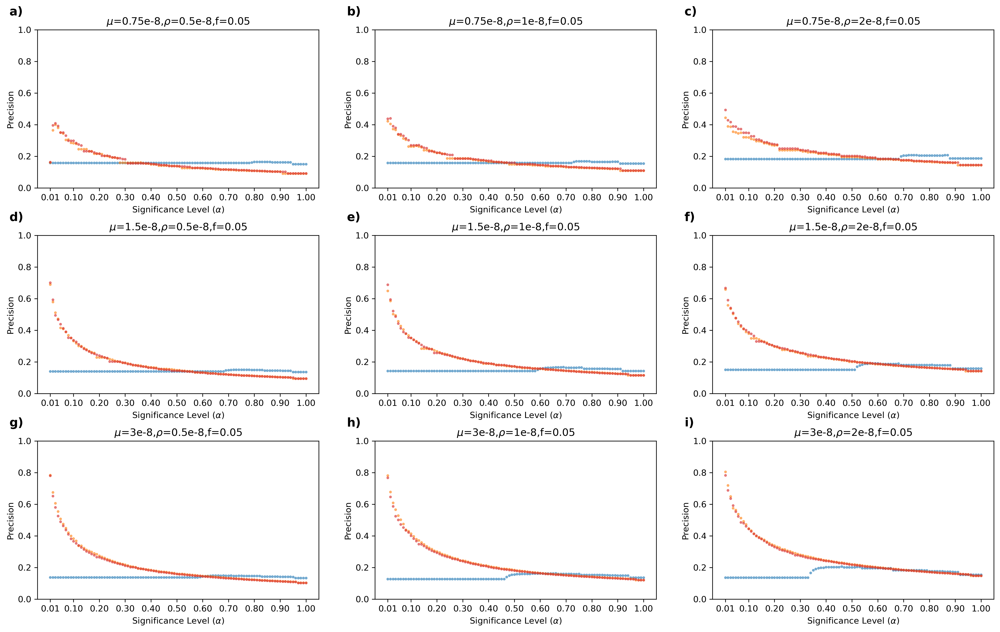

In [10]:
fig, axes = plt.subplots(
    3, 3, figsize=(20, 12), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

f = '0.05'
k = 1
for i, mu in enumerate(['0.75e-8', '1.5e-8', '3e-8']):
    for j, rho in enumerate(['0.5e-8', '1e-8', '2e-8']):
        cond_wind = dfs[i][j][k]['wind_thresh'] == 0.1
        cond_d = dfs[i][j][k]['stat'] == 'd'
        cond_dplus = dfs[i][j][k]['stat'] == 'dplus'
        cond_dstar = dfs[i][j][k]['stat'] == 'dstar'
        axes[i][j].scatter(
            xs, dfs[i][j][k][cond_wind & cond_d]['precision'].values,
            marker='o', s=5, color='tab:blue', alpha=0.5,
        )
        axes[i][j].scatter(
            xs, dfs[i][j][k][cond_wind & cond_dplus]['precision'].values,
            marker='o', s=5, color='tab:orange', alpha=0.5,
        )
        axes[i][j].scatter(
            xs, dfs[i][j][k][cond_wind & cond_dstar]['precision'].values,
            marker='o', s=5, color='tab:red', alpha=0.5,
        )
        axes[i][j].set_title(r"$\mu$={0},$\rho$={1},f={2}".format(mu, rho, f))
        axes[i][j].set_ylabel('Precision')
        axes[i][j].set_xlabel(r'Significance Level ($\alpha$)')
        axes[i][j].set_ylim(0, 1)
        axes[i][j].set_xticks(x_ticks)

for ax, i in zip(axes.flat, ['a)', 'b)', 'c)', 'd)', 'e)', 'f)', 'g)', 'h)', 'i)']):
    ax.text(
        -0.1, 1.15,
        i,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )

fig.subplots_adjust(
    wspace=0.2,  # horizontal space between subplots
    hspace=0.3   # vertical space between subplots
)
    
# Show the plot.
plt.savefig("admix_precision_f5.png", dpi=300)
plt.show()

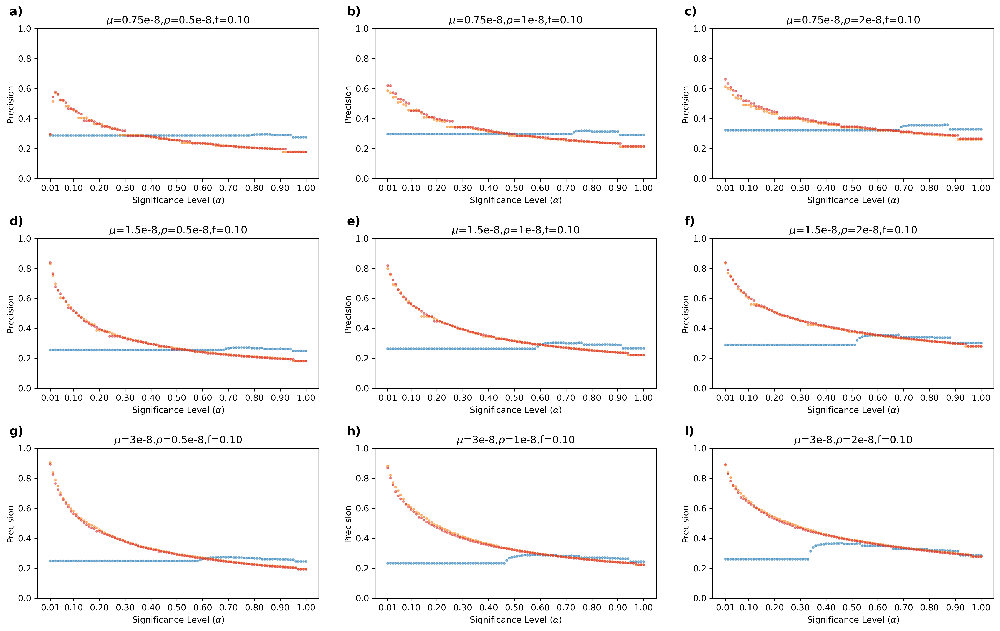

In [11]:
fig, axes = plt.subplots(
    3, 3, figsize=(20, 12), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

f = '0.10'
k = 2
for i, mu in enumerate(['0.75e-8', '1.5e-8', '3e-8']):
    for j, rho in enumerate(['0.5e-8', '1e-8', '2e-8']):
        cond_wind = dfs[i][j][k]['wind_thresh'] == 0.1
        cond_d = dfs[i][j][k]['stat'] == 'd'
        cond_dplus = dfs[i][j][k]['stat'] == 'dplus'
        cond_dstar = dfs[i][j][k]['stat'] == 'dstar'
        axes[i][j].scatter(
            xs, dfs[i][j][k][cond_wind & cond_d]['precision'].values,
            marker='o', s=5, color='tab:blue', alpha=0.5,
        )
        axes[i][j].scatter(
            xs, dfs[i][j][k][cond_wind & cond_dplus]['precision'].values,
            marker='o', s=5, color='tab:orange', alpha=0.5,
        )
        axes[i][j].scatter(
            xs, dfs[i][j][k][cond_wind & cond_dstar]['precision'].values,
            marker='o', s=5, color='tab:red', alpha=0.5,
        )
        axes[i][j].set_title(r"$\mu$={0},$\rho$={1},f={2}".format(mu, rho, f))
        axes[i][j].set_ylabel('Precision')
        axes[i][j].set_xlabel(r'Significance Level ($\alpha$)')
        axes[i][j].set_ylim(0, 1)
        axes[i][j].set_xticks(x_ticks)

for ax, i in zip(axes.flat, ['a)', 'b)', 'c)', 'd)', 'e)', 'f)', 'g)', 'h)', 'i)']):
    ax.text(
        -0.1, 1.15,
        i,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )

fig.subplots_adjust(
    wspace=0.2,  # horizontal space between subplots
    hspace=0.4   # vertical space between subplots
)
    
# Show the plot.
plt.savefig("admix_precision_f10.png", dpi=300)
plt.show()

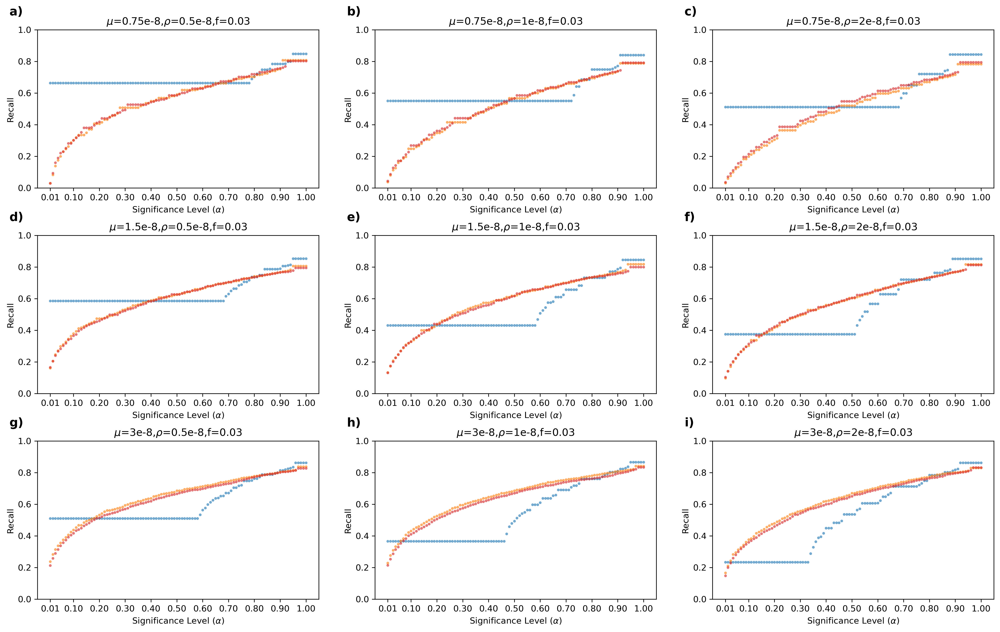

In [12]:
fig, axes = plt.subplots(
    3, 3, figsize=(20, 12), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

f = '0.03'
k = 0
for i, mu in enumerate(['0.75e-8', '1.5e-8', '3e-8']):
    for j, rho in enumerate(['0.5e-8', '1e-8', '2e-8']):
        cond_wind = dfs[i][j][k]['wind_thresh'] == 0.1
        cond_d = dfs[i][j][k]['stat'] == 'd'
        cond_dplus = dfs[i][j][k]['stat'] == 'dplus'
        cond_dstar = dfs[i][j][k]['stat'] == 'dstar'
        axes[i][j].scatter(
            xs, dfs[i][j][k][cond_wind & cond_d]['recall'].values,
            marker='o', s=5, color='tab:blue', alpha=0.5,
        )
        axes[i][j].scatter(
            xs, dfs[i][j][k][cond_wind & cond_dplus]['recall'].values,
            marker='o', s=5, color='tab:orange', alpha=0.5,
        )
        axes[i][j].scatter(
            xs, dfs[i][j][k][cond_wind & cond_dstar]['recall'].values,
            marker='o', s=5, color='tab:red', alpha=0.5,
        )
        axes[i][j].set_title(r"$\mu$={0},$\rho$={1},f={2}".format(mu, rho, f))
        axes[i][j].set_ylabel('Recall')
        axes[i][j].set_xlabel(r'Significance Level ($\alpha$)')
        axes[i][j].set_ylim(0, 1)
        axes[i][j].set_xticks(x_ticks)

for ax, i in zip(axes.flat, ['a)', 'b)', 'c)', 'd)', 'e)', 'f)', 'g)', 'h)', 'i)']):
    ax.text(
        -0.1, 1.15,
        i,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )

fig.subplots_adjust(
    wspace=0.2,  # horizontal space between subplots
    hspace=0.3   # vertical space between subplots
)
    
# Show the plot.
plt.savefig("admix_recall_f3.png", dpi=300)
plt.show()

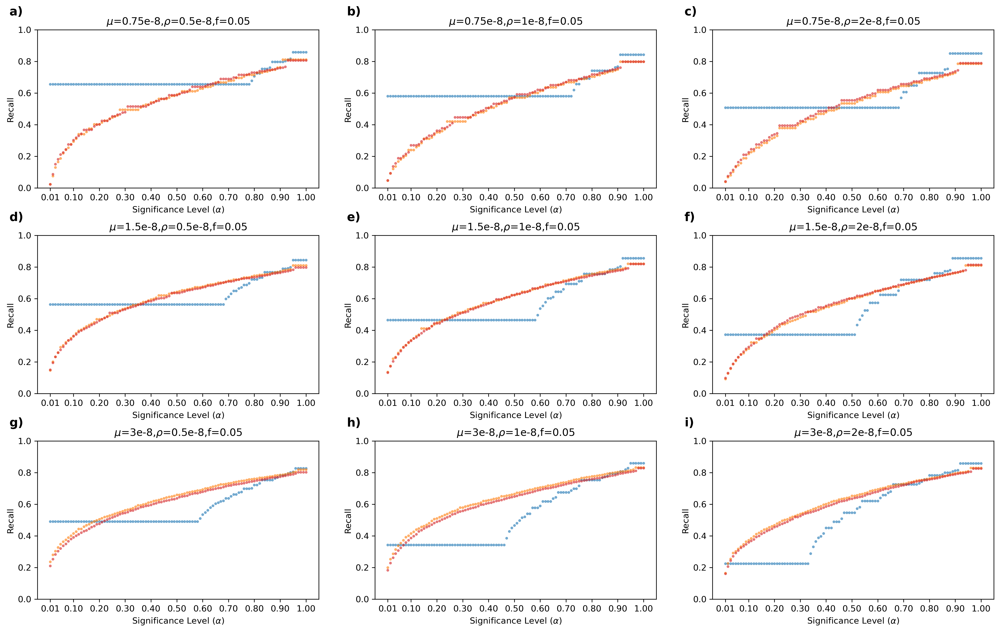

In [13]:
fig, axes = plt.subplots(
    3, 3, figsize=(20, 12), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

f = '0.05'
k = 1
for i, mu in enumerate(['0.75e-8', '1.5e-8', '3e-8']):
    for j, rho in enumerate(['0.5e-8', '1e-8', '2e-8']):
        cond_wind = dfs[i][j][k]['wind_thresh'] == 0.1
        cond_d = dfs[i][j][k]['stat'] == 'd'
        cond_dplus = dfs[i][j][k]['stat'] == 'dplus'
        cond_dstar = dfs[i][j][k]['stat'] == 'dstar'
        axes[i][j].scatter(
            xs, dfs[i][j][k][cond_wind & cond_d]['recall'].values,
            marker='o', s=5, color='tab:blue', alpha=0.5,
        )
        axes[i][j].scatter(
            xs, dfs[i][j][k][cond_wind & cond_dplus]['recall'].values,
            marker='o', s=5, color='tab:orange', alpha=0.5,
        )
        axes[i][j].scatter(
            xs, dfs[i][j][k][cond_wind & cond_dstar]['recall'].values,
            marker='o', s=5, color='tab:red', alpha=0.5,
        )
        axes[i][j].set_title(r"$\mu$={0},$\rho$={1},f={2}".format(mu, rho, f))
        axes[i][j].set_ylabel('Recall')
        axes[i][j].set_xlabel(r'Significance Level ($\alpha$)')
        axes[i][j].set_ylim(0, 1)
        axes[i][j].set_xticks(x_ticks)

for ax, i in zip(axes.flat, ['a)', 'b)', 'c)', 'd)', 'e)', 'f)', 'g)', 'h)', 'i)']):
    ax.text(
        -0.1, 1.15,
        i,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )

fig.subplots_adjust(
    wspace=0.2,  # horizontal space between subplots
    hspace=0.3   # vertical space between subplots
)
    
# Show the plot.
plt.savefig("admix_recall_f5.png", dpi=300)
plt.show()

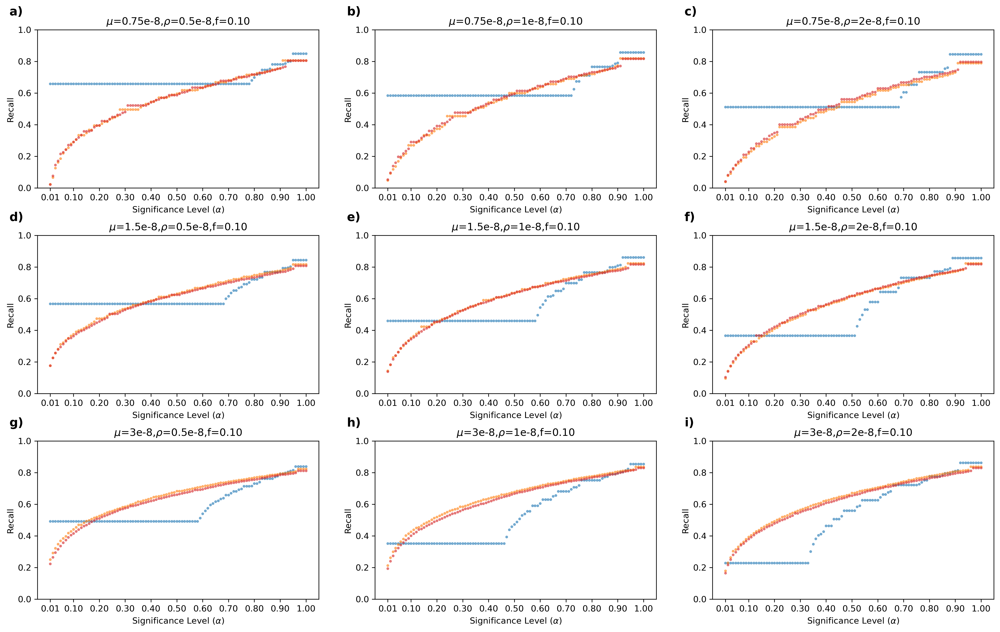

In [14]:
fig, axes = plt.subplots(
    3, 3, figsize=(20, 12), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

f = '0.10'
k = 2
for i, mu in enumerate(['0.75e-8', '1.5e-8', '3e-8']):
    for j, rho in enumerate(['0.5e-8', '1e-8', '2e-8']):
        cond_wind = dfs[i][j][k]['wind_thresh'] == 0.1
        cond_d = dfs[i][j][k]['stat'] == 'd'
        cond_dplus = dfs[i][j][k]['stat'] == 'dplus'
        cond_dstar = dfs[i][j][k]['stat'] == 'dstar'
        axes[i][j].scatter(
            xs, dfs[i][j][k][cond_wind & cond_d]['recall'].values,
            marker='o', s=5, color='tab:blue', alpha=0.5,
        )
        axes[i][j].scatter(
            xs, dfs[i][j][k][cond_wind & cond_dplus]['recall'].values,
            marker='o', s=5, color='tab:orange', alpha=0.5,
        )
        axes[i][j].scatter(
            xs, dfs[i][j][k][cond_wind & cond_dstar]['recall'].values,
            marker='o', s=5, color='tab:red', alpha=0.5,
        )
        axes[i][j].set_title(r"$\mu$={0},$\rho$={1},f={2}".format(mu, rho, f))
        axes[i][j].set_ylabel('Recall')
        axes[i][j].set_xlabel(r'Significance Level ($\alpha$)')
        axes[i][j].set_ylim(0, 1)
        axes[i][j].set_xticks(x_ticks)

for ax, i in zip(axes.flat, ['a)', 'b)', 'c)', 'd)', 'e)', 'f)', 'g)', 'h)', 'i)']):
    ax.text(
        -0.1, 1.15,
        i,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )

fig.subplots_adjust(
    wspace=0.2,  # horizontal space between subplots
    hspace=0.3   # vertical space between subplots
)
    
# Show the plot.
plt.savefig("admix_recall_f10.png", dpi=300)
plt.show()

In [3]:
# N = 2, 5, 10, 25.
dfs = []
for i, N in enumerate([2, 5, 10, 25]):
    performance_results = load_performance(alphas, f"./results/resultsNIntro/N{N}")
    performance_df = calc_performance_metrics(performance_results)
    dfs.append(performance_df)
    print(f"N={N}")
    print_precision_recall(performance_df)

N=2
alpha	D		D+		D*
0.01	0.3607/0.0099	0.5953/0.0255	0.8799/0.1464
0.02	0.4218/0.0258	0.5492/0.0435	0.8309/0.1933
0.03	0.4679/0.044	0.5387/0.0586	0.8033/0.2248
0.04	0.4773/0.0635	0.5265/0.0736	0.7815/0.254
0.05	0.4787/0.0792	0.5041/0.0852	0.7631/0.2826

N=5
alpha	D		D+		D*
0.01	0.6811/0.0112	0.7552/0.0164	0.9375/0.0837
0.02	0.7002/0.0239	0.7351/0.0281	0.9082/0.1207
0.03	0.7148/0.0369	0.7208/0.0389	0.8999/0.1563
0.04	0.7194/0.0492	0.7098/0.0513	0.8876/0.1798
0.05	0.7113/0.0623	0.6991/0.0624	0.8773/0.2003

N=10
alpha	D		D+		D*
0.01	0.8327/0.0103	0.836/0.0122	0.9513/0.0521
0.02	0.8399/0.0215	0.8217/0.0227	0.9468/0.0827
0.03	0.8228/0.0316	0.8011/0.032	0.9338/0.1075
0.04	0.8275/0.0437	0.7949/0.0413	0.929/0.1257
0.05	0.8283/0.0534	0.796/0.0517	0.9227/0.1431

N=25
alpha	D		D+		D*
0.01	0.884/0.01	0.8799/0.0096	0.9702/0.0335
0.02	0.8932/0.0196	0.8867/0.0211	0.9695/0.0597
0.03	0.9071/0.0284	0.8902/0.0311	0.9665/0.0809
0.04	0.911/0.0388	0.8872/0.0405	0.9644/0.0972
0.05	0.9041/0.0465	0.8811/0.0497

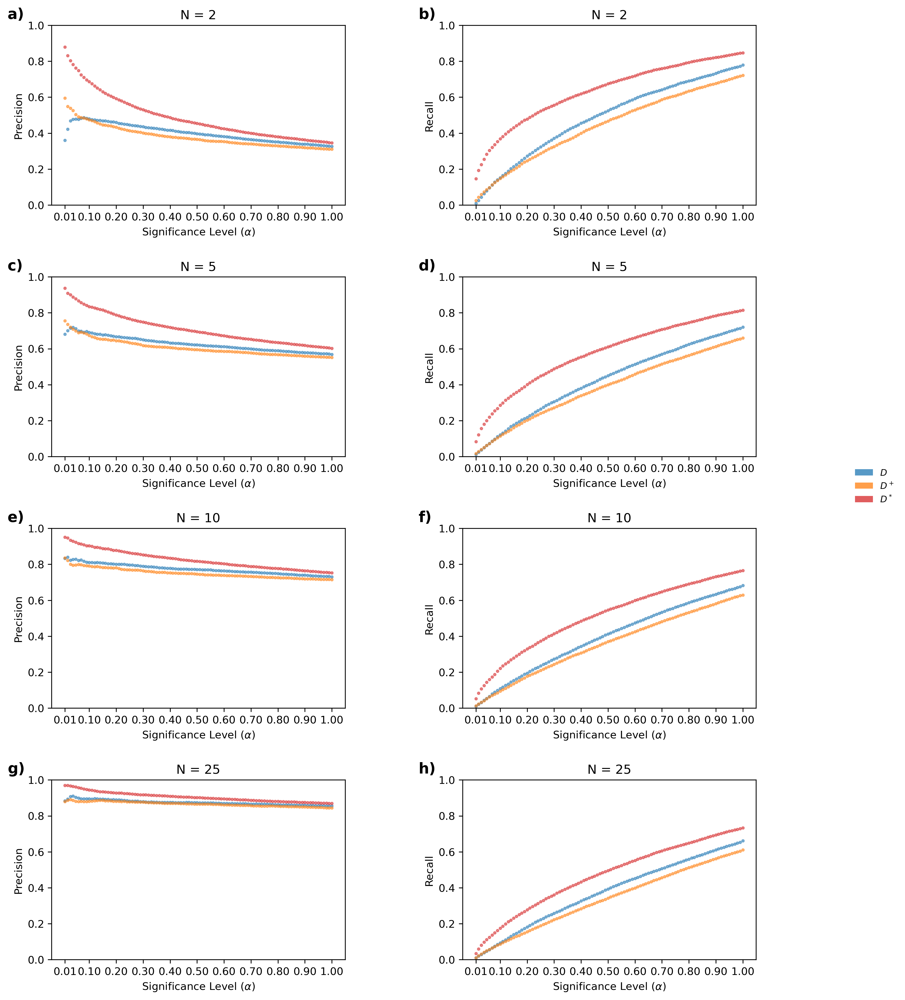

In [4]:
fig, axes = plt.subplots(
    4, 2, figsize=(12, 16), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

for i, N in enumerate([2, 5, 10, 25]):
    cond_wind = dfs[i]['wind_thresh'] == 0.1
    cond_d = dfs[i]['stat'] == 'd'
    cond_dplus = dfs[i]['stat'] == 'dplus'
    cond_dstar = dfs[i]['stat'] == 'dstar'
    axes[i][0].scatter(
        xs, dfs[i][cond_wind & cond_d]['precision'].values,
        marker='o', s=5, color='tab:blue', alpha=0.5,
    )
    axes[i][0].scatter(
        xs, dfs[i][cond_wind & cond_dplus]['precision'].values,
        marker='o', s=5, color='tab:orange', alpha=0.5,
    )
    axes[i][0].scatter(
        xs, dfs[i][cond_wind & cond_dstar]['precision'].values,
        marker='o', s=5, color='tab:red', alpha=0.5,
    )
    axes[i][1].scatter(
        xs, dfs[i][cond_wind & cond_d]['recall'].values,
        marker='o', s=5, color='tab:blue', alpha=0.5,
    )
    axes[i][1].scatter(
        xs, dfs[i][cond_wind & cond_dplus]['recall'].values,
        marker='o', s=5, color='tab:orange', alpha=0.5,
    )
    axes[i][1].scatter(
        xs, dfs[i][cond_wind & cond_dstar]['recall'].values,
        marker='o', s=5, color='tab:red', alpha=0.5,
    )
    axes[i][0].set_title(r"N = {0}".format(N))
    axes[i][0].set_ylabel('Precision')
    axes[i][0].set_xlabel(r'Significance Level ($\alpha$)')
    axes[i][0].set_ylim(0, 1)
    axes[i][0].set_xticks(x_ticks)
    axes[i][1].set_title(r"N = {0}".format(N))
    axes[i][1].set_ylabel('Recall')
    axes[i][1].set_xlabel(r'Significance Level ($\alpha$)')
    axes[i][1].set_ylim(0, 1)
    axes[i][1].set_xticks(x_ticks)

legend_elements = [
    Patch(facecolor='tab:blue', alpha=0.75, label=r'$D$'),
    Patch(facecolor='tab:orange', alpha=0.75, label=r'$D^+$'),
    Patch(facecolor='tab:red', alpha=0.75, label=r'$D^*$')
]
fig.legend(
    handles=legend_elements, loc='center left',
    bbox_to_anchor=(1.0, 0.5), frameon=False,
    fontsize=8.5,
)

for ax, label in zip(axes.flat, ['a)', 'b)', 'c)', 'd)', 'e)', 'f)', 'g)', 'h)']):
    ax.text(
        -0.15, 1.1, label,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )

fig.subplots_adjust(
    wspace=0.4,  # horizontal space between subplots
    hspace=0.4   # vertical space between subplots
)

# Show the plot.
plt.savefig("n.png", dpi=300)
plt.show()

D: Mean= -0.0009756101012626572 Std. Dev.= 0.3598601692989683
D+: Mean= 0.002668741925 Std. Dev.= 0.11240698292635504
D*: Mean= 0.00042545612499999993 Std. Dev.= 0.04524679081945066

D: Mean= 0.0005511955896692254 Std. Dev.= 0.30210534292907154
D+: Mean= 0.001562912 Std. Dev.= 0.09242257675316623
D*: Mean= 0.00018071372500000002 Std. Dev.= 0.027551554409805477

D: Mean= 0.0004956909999999997 Std. Dev.= 0.27894911454153054
D+: Mean= 9.229535e-05 Std. Dev.= 0.0851522549517831
D*: Mean= 0.00016142325 Std. Dev.= 0.022383082355933677

D: Mean= -0.0011609028152815282 Std. Dev.= 0.264122273636365
D+: Mean= 0.00019833965000000007 Std. Dev.= 0.07962055396783475
D*: Mean= -1.2628725000000007e-05 Std. Dev.= 0.01791145386583903



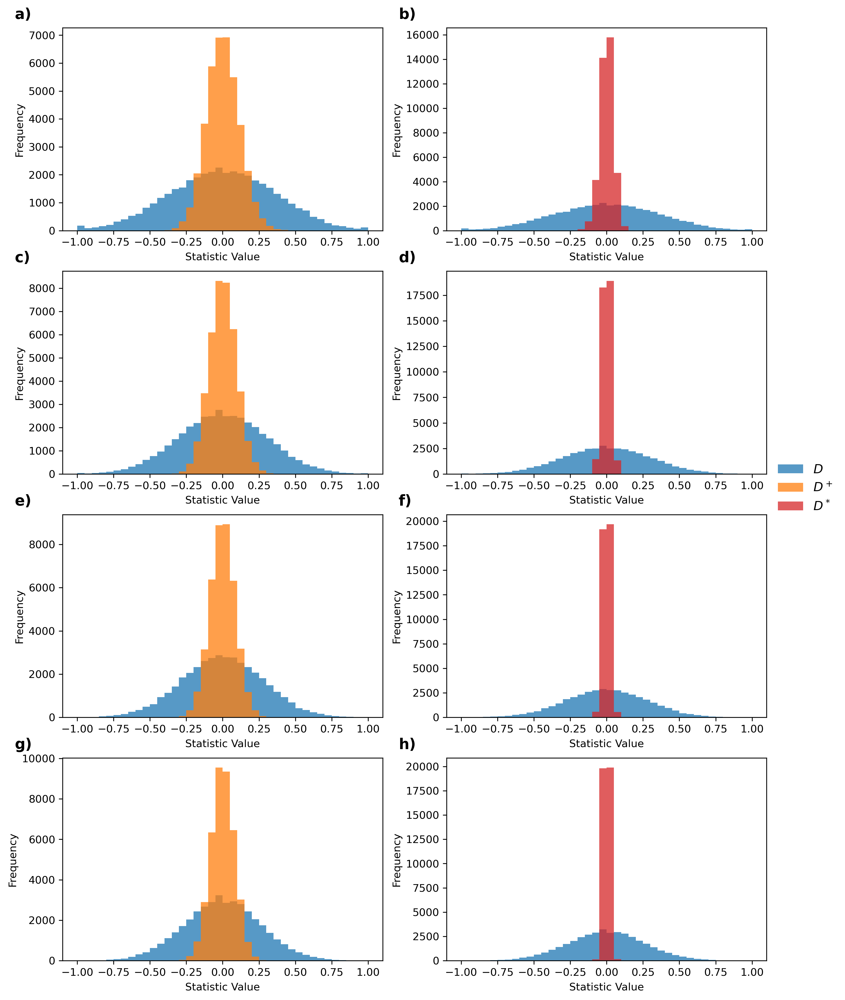

In [5]:
fig, axes = plt.subplots(
    4, 2, figsize=(12, 16), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

for i, N in enumerate([2, 5, 10, 25]):
    dNull = load_null(f'results/resultsNNoIntro/N{N}/d_null.txt')
    dplusNull = load_null(f'results/resultsNNoIntro/N{N}/dplus_null.txt')
    dstarNull = load_null(f'results/resultsNNoIntro/N{N}/dstar_null.txt')
    axes[i][0].hist(
        dNull, bins=np.arange(-1, 1.05, 0.05),
        histtype='stepfilled', color='tab:blue', alpha=0.75,
    )
    axes[i][0].hist(
        dplusNull, bins=np.arange(-1, 1.05, 0.05),
        histtype='stepfilled', color='tab:orange', alpha=0.75,
    )
    axes[i][1].hist(
        dNull, bins=np.arange(-1, 1.05, 0.05),
        histtype='stepfilled', color='tab:blue', alpha=0.75,
    )
    axes[i][1].hist(
        dstarNull, bins=np.arange(-1, 1.05, 0.05),
        histtype='stepfilled', color='tab:red', alpha=0.75,
    )
    axes[i][0].set_xlabel('Statistic Value')
    axes[i][0].set_ylabel('Frequency')
    axes[i][1].set_xlabel('Statistic Value')
    axes[i][1].set_ylabel('Frequency')

    print('D: Mean=', np.mean(dNull), 'Std. Dev.=', np.std(dNull))
    print('D+: Mean=', np.mean(dplusNull), 'Std. Dev.=', np.std(dplusNull))
    print('D*: Mean=', np.mean(dstarNull), 'Std. Dev.=', np.std(dstarNull))
    print()

legend_elements = [
    Patch(facecolor='tab:blue', alpha=0.75, label=r'$D$'),
    Patch(facecolor='tab:orange', alpha=0.75, label=r'$D^+$'),
    Patch(facecolor='tab:red', alpha=0.75, label=r'$D^*$'),
]
fig.legend(
    handles=legend_elements, loc='center left',
    bbox_to_anchor=(0.9, 0.5), frameon=False,
    fontsize=12,
)

for ax, label in zip(axes.flat, ['a)', 'b)', 'c)', 'd)', 'e)', 'f)', 'g)', 'h)']):
    ax.text(
        -0.15, 1.1, label,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )
plt.savefig("n_null.png", dpi=300)
plt.show()

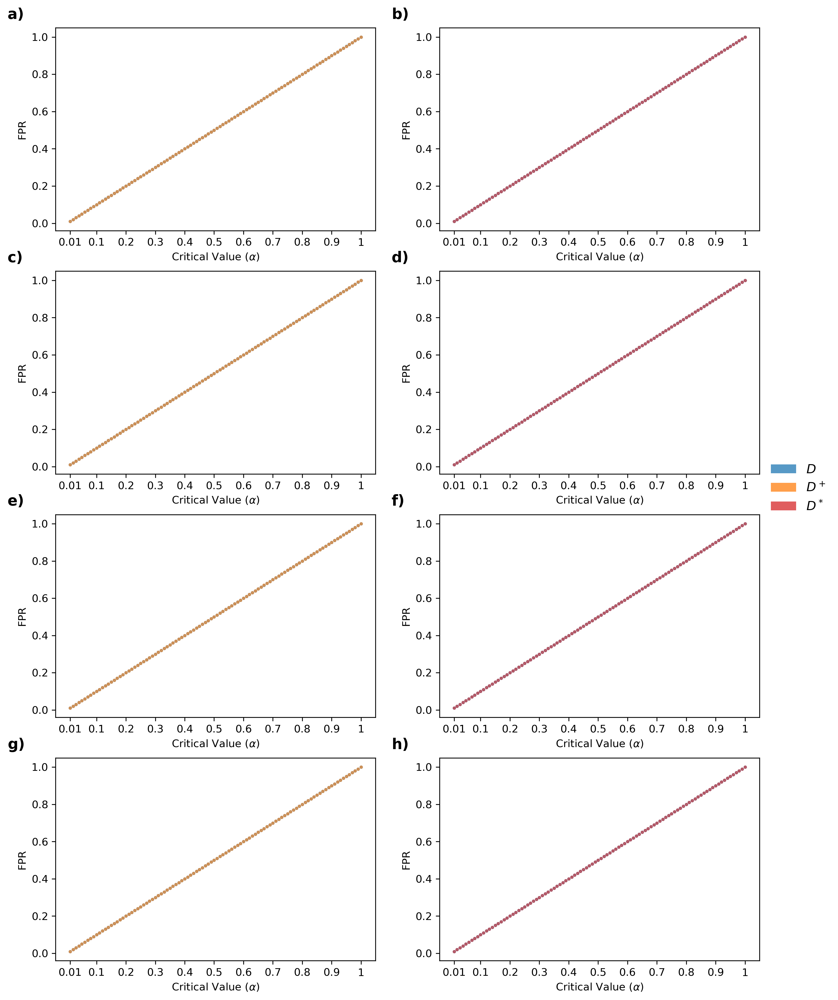

In [13]:
fig, axes = plt.subplots(
    4, 2, figsize=(12, 16), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

for i, N in enumerate([2, 5, 10, 25]):
    dFPR = pd.read_csv(f'results/resultsNNoIntro/N{N}/d_fpr.csv')
    dplusFPR = pd.read_csv(f'results/resultsNNoIntro/N{N}/dplus_fpr.csv')
    dstarFPR = pd.read_csv(f'results/resultsNNoIntro/N{N}/dstar_fpr.csv')
    axes[i][0].scatter(
        alphas, dFPR['fpr'].values,
        marker='o', s=5, color='tab:blue', alpha=0.5,
    )
    axes[i][0].scatter(
        alphas, dplusFPR['fpr'].values,
        marker='o', s=5, color='tab:orange', alpha=0.5,
    )
    axes[i][1].scatter(
        alphas, dFPR['fpr'].values,
        marker='o', s=5, color='tab:blue', alpha=0.5,
    )
    axes[i][1].scatter(
        alphas, dstarFPR['fpr'].values,
        marker='o', s=5, color='tab:red', alpha=0.5,
    )
    axes[i][0].set_xticks(x_fpr)
    axes[i][0].set_xticklabels([str(int(x)) if x.is_integer() else str(x) for x in x_fpr])
    axes[i][0].set_xlabel(r'Critical Value ($\alpha$)')
    axes[i][0].set_ylabel('FPR')
    axes[i][1].set_xticks(x_fpr)
    axes[i][1].set_xticklabels([str(int(x)) if x.is_integer() else str(x) for x in x_fpr])
    axes[i][1].set_xlabel(r'Critical Value ($\alpha$)')
    axes[i][1].set_ylabel('FPR')

legend_elements = [
    Patch(facecolor='tab:blue', alpha=0.75, label=r'$D$'),
    Patch(facecolor='tab:orange', alpha=0.75, label=r'$D^+$'),
    Patch(facecolor='tab:red', alpha=0.75, label=r'$D^*$'),
]
fig.legend(
    handles=legend_elements, loc='center left',
    bbox_to_anchor=(0.9, 0.5), frameon=False,
    fontsize=12,
)

for ax, label in zip(axes.flat, ['a)', 'b)', 'c)', 'd)', 'e)', 'f)', 'g)', 'h)']):
    ax.text(
        -0.15, 1.1, label,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )
plt.savefig("n_fpr.png", dpi=300)
plt.show()

In [6]:
# Drift.
dfs = []
for i in range(1, 7, 1):
    performance_results = load_performance(alphas, f"./results/resultsDrift/case{i}")
    performance_df = calc_performance_metrics(performance_results)
    dfs.append(performance_df)
    print(f"Case {i}")
    print_precision_recall(performance_df)

Case 1
alpha	D		D+		D*
0.01	0.1502/0.2407	0.4134/0.0248	0.4689/0.0303
0.02	0.1502/0.2407	0.3742/0.044	0.4271/0.0499
0.03	0.1502/0.2407	0.3563/0.0586	0.3908/0.0745
0.04	0.1502/0.2407	0.3414/0.0771	0.3819/0.0917
0.05	0.1502/0.2407	0.3328/0.0915	0.3667/0.109

Case 2
alpha	D		D+		D*
0.01	0.1501/0.243	0.411/0.032	0.441/0.0339
0.02	0.1501/0.243	0.3592/0.053	0.4265/0.0569
0.03	0.1501/0.243	0.3576/0.0669	0.3849/0.0743
0.04	0.1501/0.243	0.3478/0.0841	0.3725/0.0953
0.05	0.1501/0.243	0.3417/0.1013	0.3491/0.1077

Case 3
alpha	D		D+		D*
0.01	0.1569/0.2476	0.3689/0.0208	0.4413/0.0287
0.02	0.1569/0.2476	0.3304/0.0352	0.3693/0.0451
0.03	0.1569/0.2476	0.3333/0.0534	0.3531/0.0578
0.04	0.1569/0.2476	0.3027/0.0648	0.3439/0.0777
0.05	0.1569/0.2476	0.2922/0.0745	0.3342/0.0932

Case 4
alpha	D		D+		D*
0.01	0.146/0.2444	0.375/0.0283	0.4484/0.0368
0.02	0.146/0.2444	0.3611/0.0494	0.4118/0.0627
0.03	0.146/0.2444	0.3469/0.0703	0.4018/0.0848
0.04	0.146/0.2444	0.3395/0.0894	0.381/0.1047
0.05	0.146/0.2444	0.3354/0.10

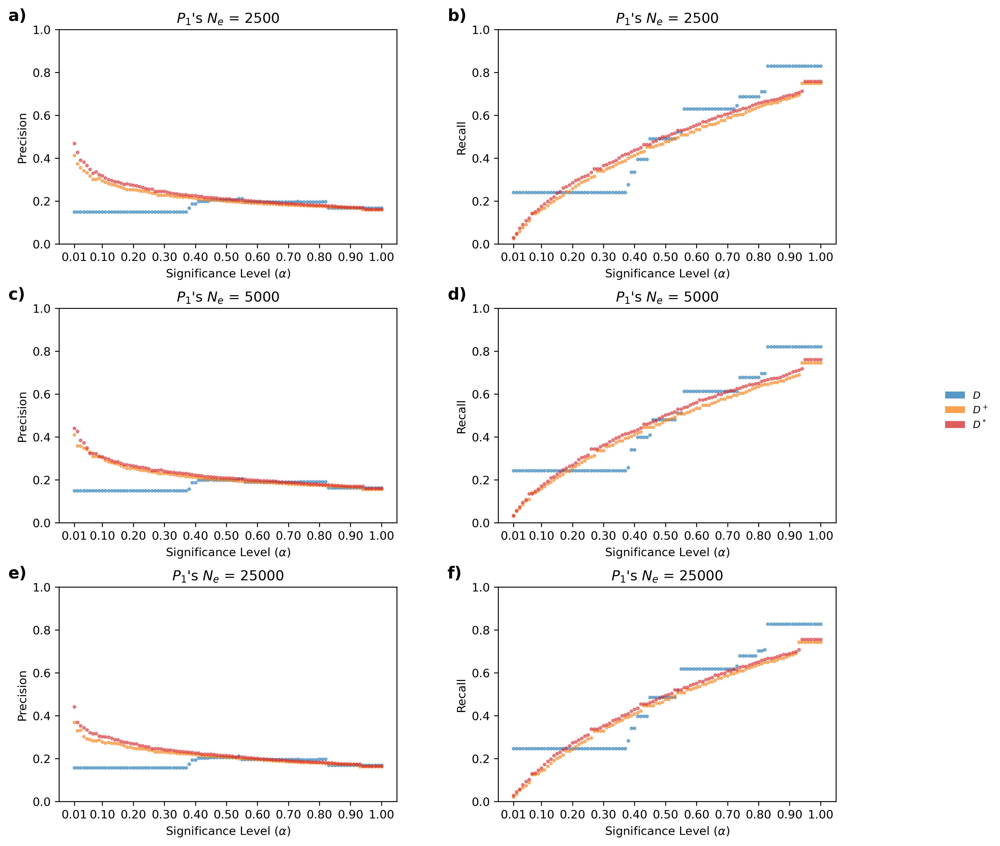

In [7]:
fig, axes = plt.subplots(
    3, 2, figsize=(12, 12), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

for i, N in enumerate([2500, 5000, 25000]):
    cond_wind = dfs[i]['wind_thresh'] == 0.1
    cond_d = dfs[i]['stat'] == 'd'
    cond_dplus = dfs[i]['stat'] == 'dplus'
    cond_dstar = dfs[i]['stat'] == 'dstar'
    axes[i][0].scatter(
        xs, dfs[i][cond_wind & cond_d]['precision'].values,
        marker='o', s=5, color='tab:blue', alpha=0.5,
    )
    axes[i][0].scatter(
        xs, dfs[i][cond_wind & cond_dplus]['precision'].values,
        marker='o', s=5, color='tab:orange', alpha=0.5,
    )
    axes[i][0].scatter(
        xs, dfs[i][cond_wind & cond_dstar]['precision'].values,
        marker='o', s=5, color='tab:red', alpha=0.5,
    )
    axes[i][1].scatter(
        xs, dfs[i][cond_wind & cond_d]['recall'].values,
        marker='o', s=5, color='tab:blue', alpha=0.5,
    )
    axes[i][1].scatter(
        xs, dfs[i][cond_wind & cond_dplus]['recall'].values,
        marker='o', s=5, color='tab:orange', alpha=0.5,
    )
    axes[i][1].scatter(
        xs, dfs[i][cond_wind & cond_dstar]['recall'].values,
        marker='o', s=5, color='tab:red', alpha=0.5,
    )
    axes[i][0].set_title(r"$P_1$'s $N_e$ = {0}".format(N))
    axes[i][0].set_ylabel('Precision')
    axes[i][0].set_xlabel(r'Significance Level ($\alpha$)')
    axes[i][0].set_ylim(0, 1)
    axes[i][0].set_xticks(x_ticks)
    axes[i][1].set_title(r"$P_1$'s $N_e$ = {0}".format(N))
    axes[i][1].set_ylabel('Recall')
    axes[i][1].set_xlabel(r'Significance Level ($\alpha$)')
    axes[i][1].set_ylim(0, 1)
    axes[i][1].set_xticks(x_ticks)

legend_elements = [
    Patch(facecolor='tab:blue', alpha=0.75, label=r'$D$'),
    Patch(facecolor='tab:orange', alpha=0.75, label=r'$D^+$'),
    Patch(facecolor='tab:red', alpha=0.75, label=r'$D^*$')
]
fig.legend(
    handles=legend_elements, loc='center left',
    bbox_to_anchor=(1.0, 0.5), frameon=False,
    fontsize=8.5,
)

for ax, label in zip(axes.flat, ['a)', 'b)', 'c)', 'd)', 'e)', 'f)', 'g)', 'h)']):
    ax.text(
        -0.15, 1.1, label,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )

fig.subplots_adjust(
    wspace=0.3,  # horizontal space between subplots
    hspace=0.3   # vertical space between subplots
)

# Show the plot.
plt.savefig("drift_p1.png", dpi=300)
plt.show()

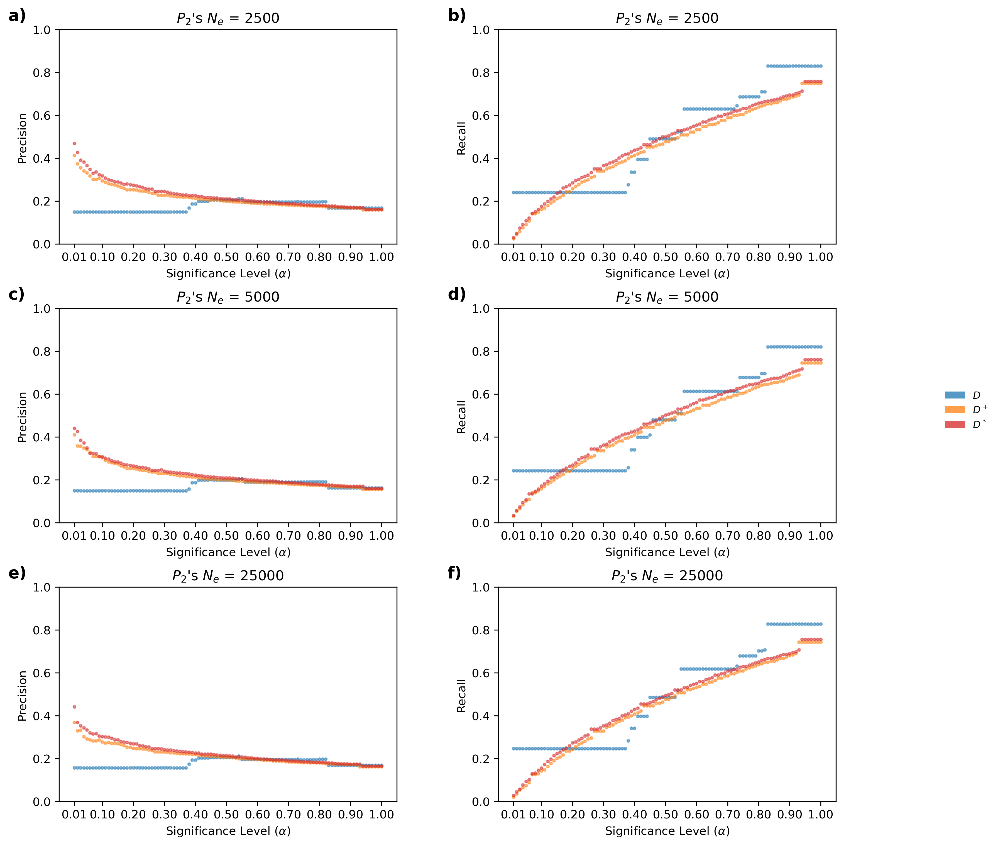

In [8]:
fig, axes = plt.subplots(
    3, 2, figsize=(12, 12), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

for i, N in enumerate([2500, 5000, 25000]):
    cond_wind = dfs[i + 3]['wind_thresh'] == 0.1
    cond_d = dfs[i + 3]['stat'] == 'd'
    cond_dplus = dfs[i + 3]['stat'] == 'dplus'
    cond_dstar = dfs[i + 3]['stat'] == 'dstar'
    axes[i][0].scatter(
        xs, dfs[i][cond_wind & cond_d]['precision'].values,
        marker='o', s=5, color='tab:blue', alpha=0.5,
    )
    axes[i][0].scatter(
        xs, dfs[i][cond_wind & cond_dplus]['precision'].values,
        marker='o', s=5, color='tab:orange', alpha=0.5,
    )
    axes[i][0].scatter(
        xs, dfs[i][cond_wind & cond_dstar]['precision'].values,
        marker='o', s=5, color='tab:red', alpha=0.5,
    )
    axes[i][1].scatter(
        xs, dfs[i][cond_wind & cond_d]['recall'].values,
        marker='o', s=5, color='tab:blue', alpha=0.5,
    )
    axes[i][1].scatter(
        xs, dfs[i][cond_wind & cond_dplus]['recall'].values,
        marker='o', s=5, color='tab:orange', alpha=0.5,
    )
    axes[i][1].scatter(
        xs, dfs[i][cond_wind & cond_dstar]['recall'].values,
        marker='o', s=5, color='tab:red', alpha=0.5,
    )
    axes[i][0].set_title(r"$P_2$'s $N_e$ = {0}".format(N))
    axes[i][0].set_ylabel('Precision')
    axes[i][0].set_xlabel(r'Significance Level ($\alpha$)')
    axes[i][0].set_ylim(0, 1)
    axes[i][0].set_xticks(x_ticks)
    axes[i][1].set_title(r"$P_2$'s $N_e$ = {0}".format(N))
    axes[i][1].set_ylabel('Recall')
    axes[i][1].set_xlabel(r'Significance Level ($\alpha$)')
    axes[i][1].set_ylim(0, 1)
    axes[i][1].set_xticks(x_ticks)

legend_elements = [
    Patch(facecolor='tab:blue', alpha=0.75, label=r'$D$'),
    Patch(facecolor='tab:orange', alpha=0.75, label=r'$D^+$'),
    Patch(facecolor='tab:red', alpha=0.75, label=r'$D^*$')
]
fig.legend(
    handles=legend_elements, loc='center left',
    bbox_to_anchor=(1.0, 0.5), frameon=False,
    fontsize=8.5,
)

for ax, label in zip(axes.flat, ['a)', 'b)', 'c)', 'd)', 'e)', 'f)', 'g)', 'h)']):
    ax.text(
        -0.15, 1.1, label,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )

fig.subplots_adjust(
    wspace=0.3,  # horizontal space between subplots
    hspace=0.3   # vertical space between subplots
)

# Show the plot.
plt.savefig("drift_p2.png", dpi=300)
plt.show()

alpha	D		D+		D*
0.01	0.875/0.0233	0.8578/0.0071	0.9459/0.019
0.02	0.875/0.0233	0.8696/0.0142	0.9255/0.033
0.03	0.875/0.0233	0.8628/0.0201	0.9192/0.0487
0.04	0.8664/0.0281	0.8547/0.0266	0.9203/0.0625
0.05	0.865/0.0355	0.8485/0.0329	0.9213/0.0749



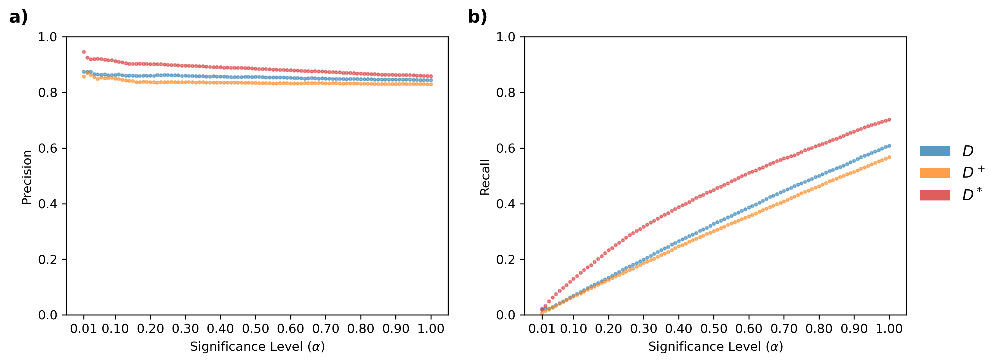

In [12]:
# Missing genotypes.
performance_results = load_performance(alphas, './results/resultsMissing')
performance_df = calc_performance_metrics(performance_results)
print_precision_recall(performance_df)
fig, axes = plt.subplots(
    1, 2, figsize=(12, 4), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

cond_wind = performance_df['wind_thresh'] == 0.1
cond_d = performance_df['stat'] == 'd'
cond_dplus = performance_df['stat'] == 'dplus'
cond_dstar = performance_df['stat'] == 'dstar'
axes[0].scatter(
    xs, performance_df[cond_wind & cond_d]['precision'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[0].scatter(
    xs, performance_df[cond_wind & cond_dplus]['precision'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[0].scatter(
    xs, performance_df[cond_wind & cond_dstar]['precision'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)

axes[1].scatter(
    xs, performance_df[cond_wind & cond_d]['recall'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[1].scatter(
    xs, performance_df[cond_wind & cond_dplus]['recall'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[1].scatter(
    xs, performance_df[cond_wind & cond_dstar]['recall'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)

axes[0].set_ylabel('Precision')
axes[1].set_ylabel('Recall')
axes[0].set_xlabel(r'Significance Level ($\alpha$)')
axes[1].set_xlabel(r'Significance Level ($\alpha$)')
axes[0].set_ylim(0, 1)
axes[1].set_ylim(0, 1)
axes[0].set_xticks(x_ticks)
axes[1].set_xticks(x_ticks)
legend_elements = [
    Patch(facecolor='tab:blue', alpha=0.75, label=r'$D$'),
    Patch(facecolor='tab:orange', alpha=0.75, label=r'$D^+$'),
    Patch(facecolor='tab:red', alpha=0.75, label=r'$D^*$')
]
fig.legend(
    handles=legend_elements, loc='center left',
    bbox_to_anchor=(0.9, 0.5), frameon=False,
    fontsize=12,
)
for ax, label in zip(axes.flat, ['a)', 'b)']):
    ax.text(
        -0.15, 1.1, label,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )
# Show the plot.
plt.savefig("missing.png", dpi=300)
plt.show()

alpha	D		D+		D*
0.01	0.9057/0.012	0.8994/0.0102	0.981/0.0774
0.02	0.9081/0.0232	0.9029/0.0185	0.976/0.113
0.03	0.9093/0.035	0.8907/0.0273	0.9754/0.1369
0.04	0.9112/0.0453	0.8915/0.0374	0.9729/0.1583
0.05	0.8976/0.0546	0.8856/0.0463	0.9682/0.1817



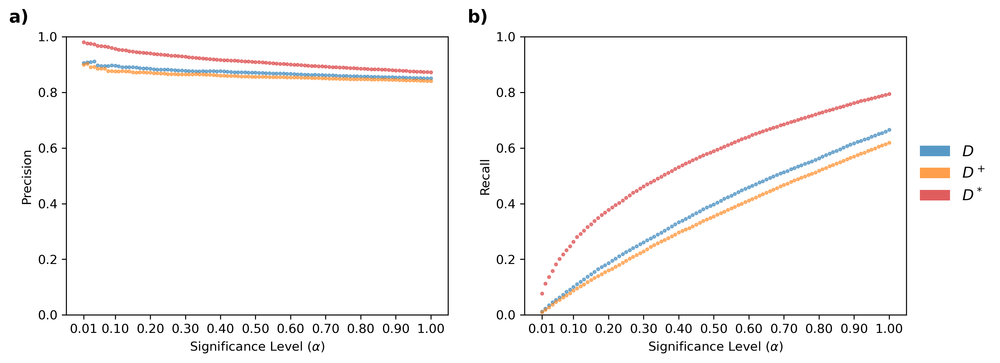

In [13]:
# Deamination.
performance_results = load_performance(alphas, './results/resultsDeamin')
performance_df = calc_performance_metrics(performance_results)
print_precision_recall(performance_df)

fig, axes = plt.subplots(
    1, 2, figsize=(12, 4), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

cond_wind = performance_df['wind_thresh'] == 0.1
cond_d = performance_df['stat'] == 'd'
cond_dplus = performance_df['stat'] == 'dplus'
cond_dstar = performance_df['stat'] == 'dstar'
axes[0].scatter(
    xs, performance_df[cond_wind & cond_d]['precision'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[0].scatter(
    xs, performance_df[cond_wind & cond_dplus]['precision'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[0].scatter(
    xs, performance_df[cond_wind & cond_dstar]['precision'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)

axes[1].scatter(
    xs, performance_df[cond_wind & cond_d]['recall'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[1].scatter(
    xs, performance_df[cond_wind & cond_dplus]['recall'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[1].scatter(
    xs, performance_df[cond_wind & cond_dstar]['recall'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)

axes[0].set_ylabel('Precision')
axes[1].set_ylabel('Recall')
axes[0].set_xlabel(r'Significance Level ($\alpha$)')
axes[1].set_xlabel(r'Significance Level ($\alpha$)')
axes[0].set_ylim(0, 1)
axes[1].set_ylim(0, 1)
axes[0].set_xticks(x_ticks)
axes[1].set_xticks(x_ticks)
legend_elements = [
    Patch(facecolor='tab:blue', alpha=0.75, label=r'$D$'),
    Patch(facecolor='tab:orange', alpha=0.75, label=r'$D^+$'),
    Patch(facecolor='tab:red', alpha=0.75, label=r'$D^*$')
]
fig.legend(
    handles=legend_elements, loc='center left',
    bbox_to_anchor=(0.9, 0.5), frameon=False,
    fontsize=12,
)
for ax, label in zip(axes.flat, ['a)', 'b)']):
    ax.text(
        -0.15, 1.1, label,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )
# Show the plot.
plt.savefig("demain.png", dpi=300)
plt.show()

alpha	D		D+		D*
0.01	0.8634/0.0744	0.8476/0.0734	0.9101/0.1475
0.02	0.859/0.0996	0.8403/0.097	0.9041/0.1834
0.03	0.861/0.1199	0.8382/0.1156	0.9036/0.2129
0.04	0.8598/0.1352	0.8369/0.1291	0.9016/0.2348
0.05	0.8626/0.1479	0.8358/0.1426	0.9022/0.2558



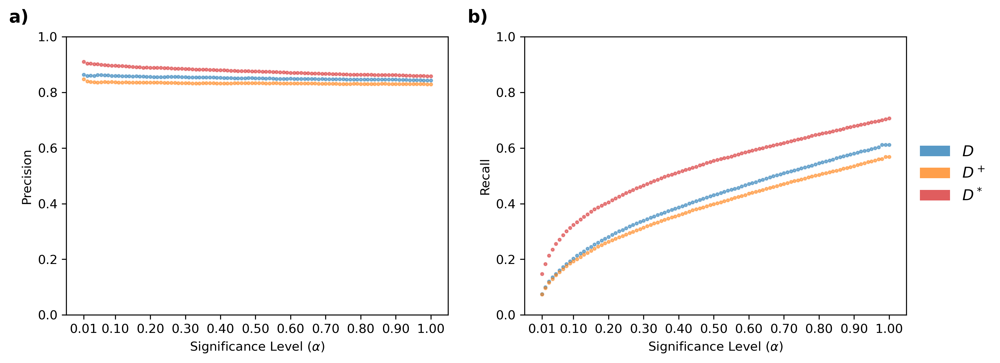

In [14]:
# Pseudohaploidization.
performance_results = load_performance(alphas, './results/resultsPseudoHap')
performance_df = calc_performance_metrics(performance_results)
print_precision_recall(performance_df)

fig, axes = plt.subplots(
    1, 2, figsize=(12, 4), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

cond_wind = performance_df['wind_thresh'] == 0.1
cond_d = performance_df['stat'] == 'd'
cond_dplus = performance_df['stat'] == 'dplus'
cond_dstar = performance_df['stat'] == 'dstar'
axes[0].scatter(
    xs, performance_df[cond_wind & cond_d]['precision'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[0].scatter(
    xs, performance_df[cond_wind & cond_dplus]['precision'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[0].scatter(
    xs, performance_df[cond_wind & cond_dstar]['precision'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)

axes[1].scatter(
    xs, performance_df[cond_wind & cond_d]['recall'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[1].scatter(
    xs, performance_df[cond_wind & cond_dplus]['recall'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[1].scatter(
    xs, performance_df[cond_wind & cond_dstar]['recall'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)

axes[0].set_ylabel('Precision')
axes[1].set_ylabel('Recall')
axes[0].set_xlabel(r'Significance Level ($\alpha$)')
axes[1].set_xlabel(r'Significance Level ($\alpha$)')
axes[0].set_ylim(0, 1)
axes[1].set_ylim(0, 1)
axes[0].set_xticks(x_ticks)
axes[1].set_xticks(x_ticks)
legend_elements = [
    Patch(facecolor='tab:blue', alpha=0.75, label=r'$D$'),
    Patch(facecolor='tab:orange', alpha=0.75, label=r'$D^+$'),
    Patch(facecolor='tab:red', alpha=0.75, label=r'$D^*$')
]
fig.legend(
    handles=legend_elements, loc='center left',
    bbox_to_anchor=(0.9, 0.5), frameon=False,
    fontsize=12,
)
for ax, label in zip(axes.flat, ['a)', 'b)']):
    ax.text(
        -0.15, 1.1, label,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )
# Show the plot.
plt.savefig("pseudohap.png", dpi=300)
plt.show()

alpha	D		D+		D*
0.01	0.8525/0.0515	0.8421/0.0068	0.9437/0.0145
0.02	0.8525/0.0515	0.8264/0.0127	0.9203/0.0275
0.03	0.8525/0.0515	0.8275/0.0178	0.9294/0.0385
0.04	0.8525/0.0515	0.8278/0.0241	0.9106/0.0491
0.05	0.8525/0.0515	0.8324/0.0302	0.9142/0.0594



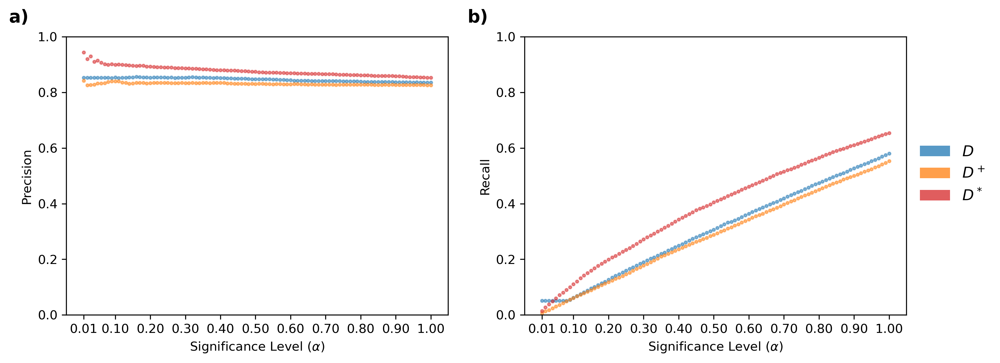

In [15]:
# Missing Genotypes, Deamination, and Pseudohaploidization.
performance_results = load_performance(alphas, './results/resultsADNA')
performance_df = calc_performance_metrics(performance_results)
print_precision_recall(performance_df)

fig, axes = plt.subplots(
    1, 2, figsize=(12, 4), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

cond_wind = performance_df['wind_thresh'] == 0.1
cond_d = performance_df['stat'] == 'd'
cond_dplus = performance_df['stat'] == 'dplus'
cond_dstar = performance_df['stat'] == 'dstar'
axes[0].scatter(
    xs, performance_df[cond_wind & cond_d]['precision'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[0].scatter(
    xs, performance_df[cond_wind & cond_dplus]['precision'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[0].scatter(
    xs, performance_df[cond_wind & cond_dstar]['precision'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)

axes[1].scatter(
    xs, performance_df[cond_wind & cond_d]['recall'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[1].scatter(
    xs, performance_df[cond_wind & cond_dplus]['recall'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[1].scatter(
    xs, performance_df[cond_wind & cond_dstar]['recall'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)

axes[0].set_ylabel('Precision')
axes[1].set_ylabel('Recall')
axes[0].set_xlabel(r'Significance Level ($\alpha$)')
axes[1].set_xlabel(r'Significance Level ($\alpha$)')
axes[0].set_ylim(0, 1)
axes[1].set_ylim(0, 1)
axes[0].set_xticks(x_ticks)
axes[1].set_xticks(x_ticks)
legend_elements = [
    Patch(facecolor='tab:blue', alpha=0.75, label=r'$D$'),
    Patch(facecolor='tab:orange', alpha=0.75, label=r'$D^+$'),
    Patch(facecolor='tab:red', alpha=0.75, label=r'$D^*$')
]
fig.legend(
    handles=legend_elements, loc='center left',
    bbox_to_anchor=(0.9, 0.5), frameon=False,
    fontsize=12,
)
for ax, label in zip(axes.flat, ['a)', 'b)']):
    ax.text(
        -0.15, 1.1, label,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )
# Show the plot.
plt.savefig("adna.png", dpi=300)
plt.show()

alpha	D		D+		D*
0.01	0.8925/0.0106	0.8949/0.01	0.9804/0.0818
0.02	0.9159/0.0217	0.8874/0.0191	0.978/0.1121
0.03	0.913/0.0317	0.8874/0.028	0.9757/0.1398
0.04	0.9085/0.0427	0.8882/0.0373	0.9718/0.1607
0.05	0.9044/0.0539	0.8903/0.0465	0.9688/0.1854



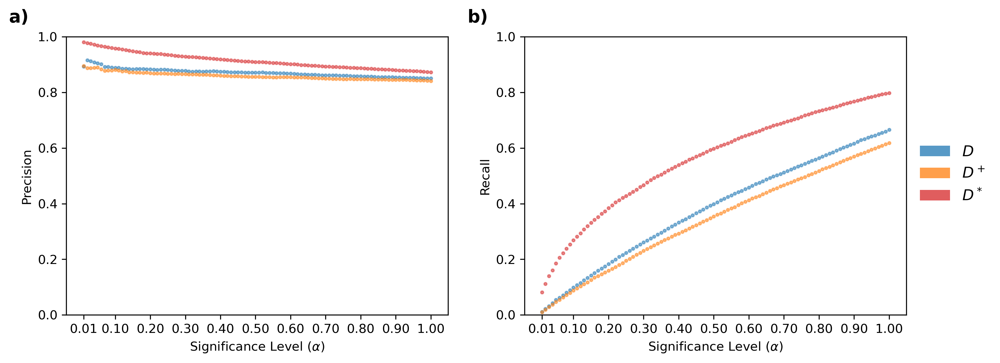

In [16]:
# Diploid simulations used for the missing, pseudohap, deamination, and aDNA.
performance_results = load_performance(alphas, './results/resultsDiploid')
performance_df = calc_performance_metrics(performance_results)
print_precision_recall(performance_df)

fig, axes = plt.subplots(
    1, 2, figsize=(12, 4), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

cond_wind = performance_df['wind_thresh'] == 0.1
cond_d = performance_df['stat'] == 'd'
cond_dplus = performance_df['stat'] == 'dplus'
cond_dstar = performance_df['stat'] == 'dstar'
axes[0].scatter(
    xs, performance_df[cond_wind & cond_d]['precision'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[0].scatter(
    xs, performance_df[cond_wind & cond_dplus]['precision'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[0].scatter(
    xs, performance_df[cond_wind & cond_dstar]['precision'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)

axes[1].scatter(
    xs, performance_df[cond_wind & cond_d]['recall'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[1].scatter(
    xs, performance_df[cond_wind & cond_dplus]['recall'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[1].scatter(
    xs, performance_df[cond_wind & cond_dstar]['recall'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)

axes[0].set_ylabel('Precision')
axes[1].set_ylabel('Recall')
axes[0].set_xlabel(r'Significance Level ($\alpha$)')
axes[1].set_xlabel(r'Significance Level ($\alpha$)')
axes[0].set_ylim(0, 1)
axes[1].set_ylim(0, 1)
axes[0].set_xticks(x_ticks)
axes[1].set_xticks(x_ticks)
legend_elements = [
    Patch(facecolor='tab:blue', alpha=0.75, label=r'$D$'),
    Patch(facecolor='tab:orange', alpha=0.75, label=r'$D^+$'),
    Patch(facecolor='tab:red', alpha=0.75, label=r'$D^*$')
]
fig.legend(
    handles=legend_elements, loc='center left',
    bbox_to_anchor=(0.9, 0.5), frameon=False,
    fontsize=12,
)
for ax, label in zip(axes.flat, ['a)', 'b)']):
    ax.text(
        -0.15, 1.1, label,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )
# Show the plot.
plt.savefig("diploid.png", dpi=300)
plt.show()

alpha	D		D+		D*
0.01	0.8925/0.0106	0.8949/0.01	0.9804/0.0818
0.02	0.9159/0.0217	0.8874/0.0191	0.978/0.1121
0.03	0.913/0.0317	0.8874/0.028	0.9757/0.1398
0.04	0.9085/0.0427	0.8882/0.0373	0.9718/0.1607
0.05	0.9044/0.0539	0.8903/0.0465	0.9688/0.1854

alpha	D		D+		D*
0.01	0.8525/0.0515	0.8421/0.0068	0.9437/0.0145
0.02	0.8525/0.0515	0.8264/0.0127	0.9203/0.0275
0.03	0.8525/0.0515	0.8275/0.0178	0.9294/0.0385
0.04	0.8525/0.0515	0.8278/0.0241	0.9106/0.0491
0.05	0.8525/0.0515	0.8324/0.0302	0.9142/0.0594



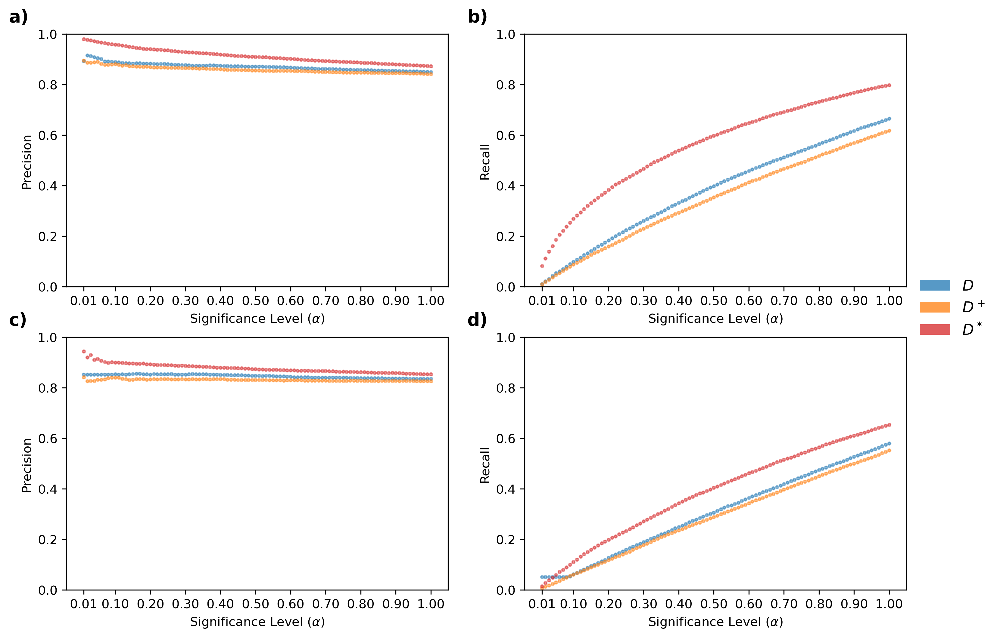

In [18]:
# Show the diploid with the aDNA results for comparison.
performance_results_diploid = load_performance(alphas, './results/resultsDiploid')
performance_df_diploid = calc_performance_metrics(performance_results_diploid)
print_precision_recall(performance_df_diploid)
performance_results_aDNA = load_performance(alphas, './results/resultsADNA')
performance_df_aDNA = calc_performance_metrics(performance_results_aDNA)
print_precision_recall(performance_df_aDNA)

fig, axes = plt.subplots(
    2, 2, figsize=(12, 8), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

cond_wind = performance_df_diploid['wind_thresh'] == 0.1
cond_d = performance_df_diploid['stat'] == 'd'
cond_dplus = performance_df_diploid['stat'] == 'dplus'
cond_dstar = performance_df_diploid['stat'] == 'dstar'
axes[0][0].scatter(
    xs, performance_df_diploid[cond_wind & cond_d]['precision'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[0][0].scatter(
    xs, performance_df_diploid[cond_wind & cond_dplus]['precision'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[0][0].scatter(
    xs, performance_df_diploid[cond_wind & cond_dstar]['precision'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)

axes[0][1].scatter(
    xs, performance_df_diploid[cond_wind & cond_d]['recall'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[0][1].scatter(
    xs, performance_df_diploid[cond_wind & cond_dplus]['recall'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[0][1].scatter(
    xs, performance_df_diploid[cond_wind & cond_dstar]['recall'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)
axes[0][0].set_ylabel('Precision')
axes[0][1].set_ylabel('Recall')
axes[0][0].set_xlabel(r'Significance Level ($\alpha$)')
axes[0][1].set_xlabel(r'Significance Level ($\alpha$)')
axes[0][0].set_ylim(0, 1)
axes[0][1].set_ylim(0, 1)
axes[0][0].set_xticks(x_ticks)
axes[0][1].set_xticks(x_ticks)

cond_wind = performance_df_aDNA['wind_thresh'] == 0.1
cond_d = performance_df_aDNA['stat'] == 'd'
cond_dplus = performance_df_aDNA['stat'] == 'dplus'
cond_dstar = performance_df_aDNA['stat'] == 'dstar'
axes[1][0].scatter(
    xs, performance_df_aDNA[cond_wind & cond_d]['precision'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[1][0].scatter(
    xs, performance_df_aDNA[cond_wind & cond_dplus]['precision'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[1][0].scatter(
    xs, performance_df_aDNA[cond_wind & cond_dstar]['precision'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)

axes[1][1].scatter(
    xs, performance_df_aDNA[cond_wind & cond_d]['recall'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[1][1].scatter(
    xs, performance_df_aDNA[cond_wind & cond_dplus]['recall'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[1][1].scatter(
    xs, performance_df_aDNA[cond_wind & cond_dstar]['recall'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)
axes[1][0].set_ylabel('Precision')
axes[1][1].set_ylabel('Recall')
axes[1][0].set_xlabel(r'Significance Level ($\alpha$)')
axes[1][1].set_xlabel(r'Significance Level ($\alpha$)')
axes[1][0].set_ylim(0, 1)
axes[1][1].set_ylim(0, 1)
axes[1][0].set_xticks(x_ticks)
axes[1][1].set_xticks(x_ticks)

legend_elements = [
    Patch(facecolor='tab:blue', alpha=0.75, label=r'$D$'),
    Patch(facecolor='tab:orange', alpha=0.75, label=r'$D^+$'),
    Patch(facecolor='tab:red', alpha=0.75, label=r'$D^*$')
]
fig.legend(
    handles=legend_elements, loc='center left',
    bbox_to_anchor=(0.9, 0.5), frameon=False,
    fontsize=12,
)
for ax, label in zip(axes.flat, ['a)', 'b)', 'c)', 'd)']):
    ax.text(
        -0.15, 1.1, label,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )
# Show the plot.
plt.savefig("diploid_and_aDNA.png", dpi=300)
plt.show()

In [9]:
# Molecular Clock Violations.
dfs = []
for i in range(1, 9, 1):
    performance_results = load_performance(alphas, f"./results/resultsMolClock/case{i}")
    performance_df = calc_performance_metrics(performance_results)
    dfs.append(performance_df)
    print(f"Case {i}")
    print_precision_recall(performance_df)

Case 1
alpha	D		D+		D*
0.01	0.1632/0.2445	0.4223/0.0279	0.4361/0.0297
0.02	0.1632/0.2445	0.3826/0.0433	0.4023/0.0464
0.03	0.1632/0.2445	0.361/0.0591	0.3885/0.066
0.04	0.1632/0.2445	0.3337/0.0738	0.3725/0.0792
0.05	0.1632/0.2445	0.3282/0.0858	0.3585/0.0954

Case 2
alpha	D		D+		D*
0.01	0.1531/0.239	0.4341/0.0259	0.4618/0.0335
0.02	0.1531/0.239	0.3911/0.0449	0.4304/0.0551
0.03	0.1531/0.239	0.3875/0.0701	0.4135/0.0764
0.04	0.1531/0.239	0.3544/0.0856	0.4101/0.0944
0.05	0.1531/0.239	0.3423/0.0967	0.3907/0.1124

Case 3
alpha	D		D+		D*
0.01	0.1401/0.2198	0.332/0.0199	0.4069/0.028
0.02	0.1401/0.2198	0.3097/0.0403	0.3589/0.0456
0.03	0.1401/0.2198	0.289/0.0532	0.3465/0.0645
0.04	0.1401/0.2198	0.2735/0.0643	0.3121/0.0826
0.05	0.1401/0.2198	0.2616/0.0802	0.3068/0.0933

Case 4
alpha	D		D+		D*
0.01	0.1577/0.2353	0.3612/0.0186	0.3566/0.022
0.02	0.1577/0.2353	0.2894/0.0279	0.316/0.0359
0.03	0.1577/0.2353	0.2672/0.0431	0.2997/0.0486
0.04	0.1577/0.2353	0.2523/0.0508	0.2981/0.0615
0.05	0.1577/0.2353	0.242

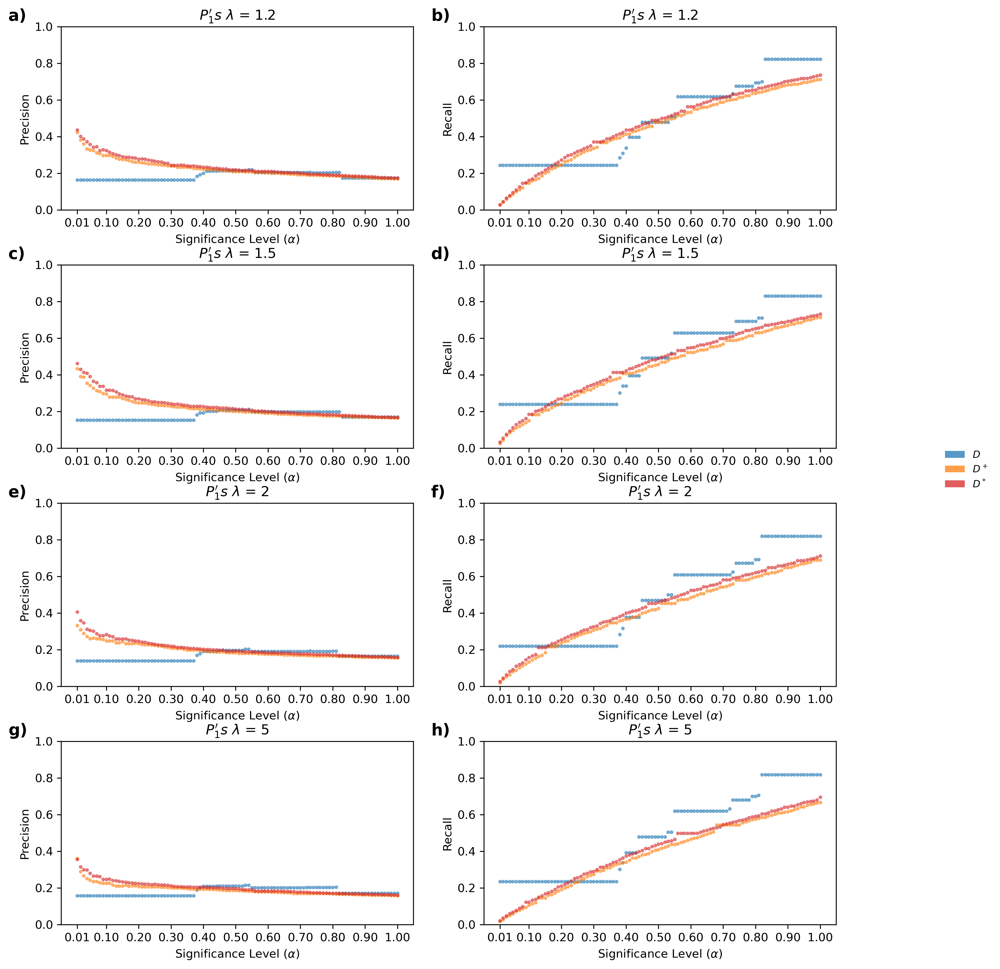

In [10]:
fig, axes = plt.subplots(
    4, 2, figsize=(12, 14), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

for i, l in enumerate([1.2, 1.5, 2, 5]):
    cond_wind = dfs[i]['wind_thresh'] == 0.1
    cond_d = dfs[i]['stat'] == 'd'
    cond_dplus = dfs[i]['stat'] == 'dplus'
    cond_dstar = dfs[i]['stat'] == 'dstar'
    axes[i][0].scatter(
        xs, dfs[i][cond_wind & cond_d]['precision'].values,
        marker='o', s=5, color='tab:blue', alpha=0.5,
    )
    axes[i][0].scatter(
        xs, dfs[i][cond_wind & cond_dplus]['precision'].values,
        marker='o', s=5, color='tab:orange', alpha=0.5,
    )
    axes[i][0].scatter(
        xs, dfs[i][cond_wind & cond_dstar]['precision'].values,
        marker='o', s=5, color='tab:red', alpha=0.5,
    )
    axes[i][1].scatter(
        xs, dfs[i][cond_wind & cond_d]['recall'].values,
        marker='o', s=5, color='tab:blue', alpha=0.5,
    )
    axes[i][1].scatter(
        xs, dfs[i][cond_wind & cond_dplus]['recall'].values,
        marker='o', s=5, color='tab:orange', alpha=0.5,
    )
    axes[i][1].scatter(
        xs, dfs[i][cond_wind & cond_dstar]['recall'].values,
        marker='o', s=5, color='tab:red', alpha=0.5,
    )
    axes[i][0].set_title(r"$P_1's$ $\lambda$ = {0}".format(l))
    axes[i][0].set_ylabel('Precision')
    axes[i][0].set_xlabel(r'Significance Level ($\alpha$)')
    axes[i][0].set_ylim(0, 1)
    axes[i][0].set_xticks(x_ticks)
    axes[i][1].set_title(r"$P_1's$ $\lambda$ = {0}".format(l))
    axes[i][1].set_ylabel('Recall')
    axes[i][1].set_xlabel(r'Significance Level ($\alpha$)')
    axes[i][1].set_ylim(0, 1)
    axes[i][1].set_xticks(x_ticks)

legend_elements = [
    Patch(facecolor='tab:blue', alpha=0.75, label=r'$D$'),
    Patch(facecolor='tab:orange', alpha=0.75, label=r'$D^+$'),
    Patch(facecolor='tab:red', alpha=0.75, label=r'$D^*$')
]
fig.legend(
    handles=legend_elements, loc='center left',
    bbox_to_anchor=(1.0, 0.5), frameon=False,
    fontsize=8.5,
)

for ax, label in zip(axes.flat, ['a)', 'b)', 'c)', 'd)', 'e)', 'f)', 'g)', 'h)']):
    ax.text(
        -0.15, 1.1, label,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )

fig.subplots_adjust(
    wspace=0.2,  # horizontal space between subplots
    hspace=0.3   # vertical space between subplots
)

# Show the plot.
plt.savefig("mol_clock_p1.png", dpi=300)
plt.show()

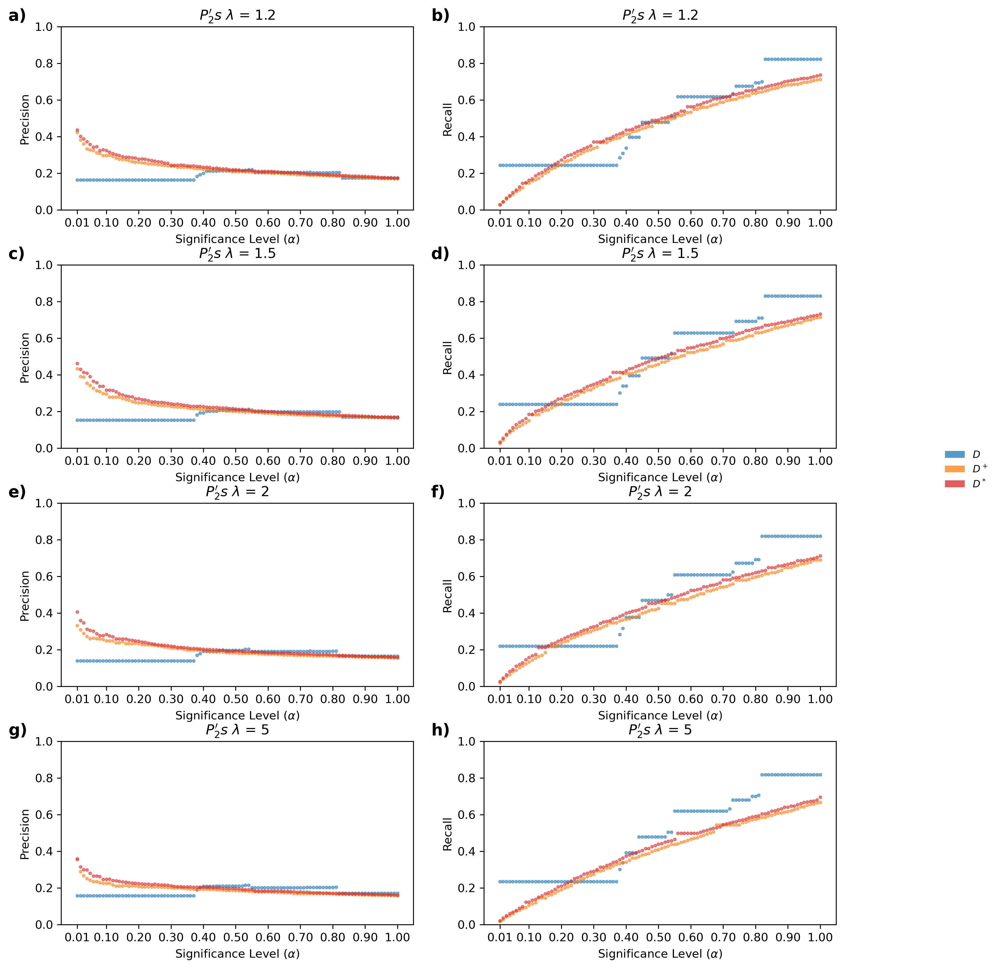

In [11]:
fig, axes = plt.subplots(
    4, 2, figsize=(12, 14), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

for i, l in enumerate([1.2, 1.5, 2, 5]):
    cond_wind = dfs[i + 4]['wind_thresh'] == 0.1
    cond_d = dfs[i + 4]['stat'] == 'd'
    cond_dplus = dfs[i + 4]['stat'] == 'dplus'
    cond_dstar = dfs[i + 4]['stat'] == 'dstar'
    axes[i][0].scatter(
        xs, dfs[i][cond_wind & cond_d]['precision'].values,
        marker='o', s=5, color='tab:blue', alpha=0.5,
    )
    axes[i][0].scatter(
        xs, dfs[i][cond_wind & cond_dplus]['precision'].values,
        marker='o', s=5, color='tab:orange', alpha=0.5,
    )
    axes[i][0].scatter(
        xs, dfs[i][cond_wind & cond_dstar]['precision'].values,
        marker='o', s=5, color='tab:red', alpha=0.5,
    )
    axes[i][1].scatter(
        xs, dfs[i][cond_wind & cond_d]['recall'].values,
        marker='o', s=5, color='tab:blue', alpha=0.5,
    )
    axes[i][1].scatter(
        xs, dfs[i][cond_wind & cond_dplus]['recall'].values,
        marker='o', s=5, color='tab:orange', alpha=0.5,
    )
    axes[i][1].scatter(
        xs, dfs[i][cond_wind & cond_dstar]['recall'].values,
        marker='o', s=5, color='tab:red', alpha=0.5,
    )
    axes[i][0].set_title(r"$P_2's$ $\lambda$ = {0}".format(l))
    axes[i][0].set_ylabel('Precision')
    axes[i][0].set_xlabel(r'Significance Level ($\alpha$)')
    axes[i][0].set_ylim(0, 1)
    axes[i][0].set_xticks(x_ticks)
    axes[i][1].set_title(r"$P_2's$ $\lambda$ = {0}".format(l))
    axes[i][1].set_ylabel('Recall')
    axes[i][1].set_xlabel(r'Significance Level ($\alpha$)')
    axes[i][1].set_ylim(0, 1)
    axes[i][1].set_xticks(x_ticks)

legend_elements = [
    Patch(facecolor='tab:blue', alpha=0.75, label=r'$D$'),
    Patch(facecolor='tab:orange', alpha=0.75, label=r'$D^+$'),
    Patch(facecolor='tab:red', alpha=0.75, label=r'$D^*$')
]
fig.legend(
    handles=legend_elements, loc='center left',
    bbox_to_anchor=(1.0, 0.5), frameon=False,
    fontsize=8.5,
)

for ax, label in zip(axes.flat, ['a)', 'b)', 'c)', 'd)', 'e)', 'f)', 'g)', 'h)']):
    ax.text(
        -0.15, 1.1, label,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )

fig.subplots_adjust(
    wspace=0.2,  # horizontal space between subplots
    hspace=0.3   # vertical space between subplots
)

# Show the plot.
plt.savefig("mol_clock_p2.png", dpi=300)
plt.show()

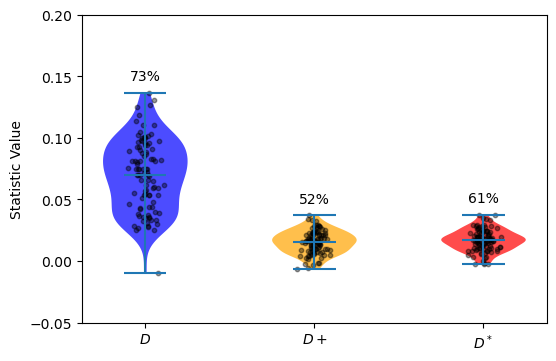

In [5]:
# Global results N = 1
global_df = pd.read_csv('results/runN1Intro/global.tsv', sep='\t')

positions = [1, 2, 3]

plt.figure(figsize=(6, 4))
violins = plt.violinplot([global_df['D'], global_df['D+'], global_df['D*']], positions=positions, showextrema=True, showmeans = True)

# Color
colors = ['blue', 'orange', 'red']
for body, color in zip(violins['bodies'], colors):
    body.set_facecolor(color)
    body.set_alpha(0.7)

# Overlay points with jitter
for i, d in enumerate([global_df['D'], global_df['D+'], global_df['D*']]):
    x = np.random.normal(positions[i], 0.04, size=len(d))
    plt.scatter(x, d, s=10, alpha=0.4, color='black')

# Add power labels.
count = np.sum(global_df.iloc[:,4] < 0.05)
plt.text(1, np.max(global_df.iloc[:,1]) + 0.01, f"{count}%",
    ha='center', fontsize=10)
count = np.sum(global_df.iloc[:,5] < 0.05)
plt.text(2, np.max(global_df.iloc[:,2]) + 0.01, f"{count}%",
    ha='center', fontsize=10)
count = np.sum(global_df.iloc[:,6] < 0.05)
plt.text(3, np.max(global_df.iloc[:,3]) + 0.01, f"{count}%",
    ha='center', fontsize=10)

plt.xticks(positions, [r'$D$', r'$D+$', r'$D^*$'])
plt.ylabel('Statistic Value')
plt.ylim((-0.05, 0.2))
plt.savefig("n1_global.png", dpi=300)
plt.show()

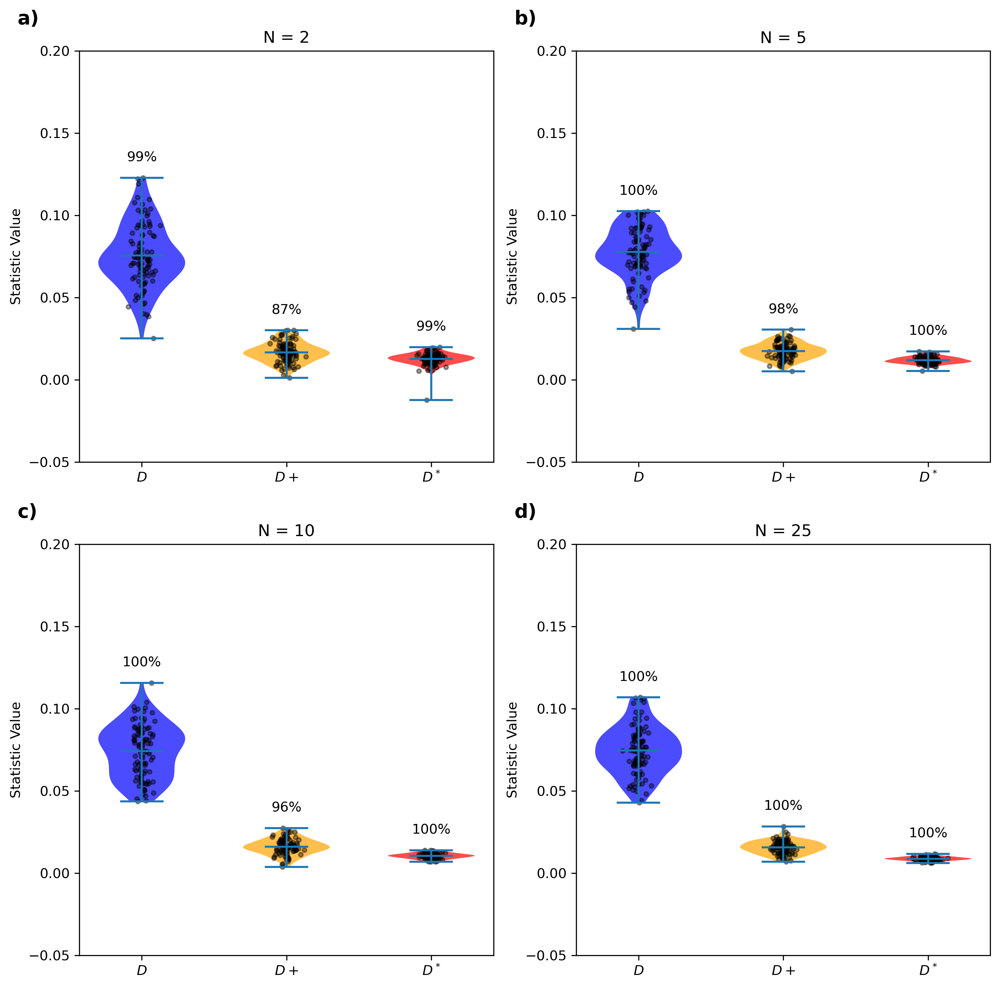

In [6]:
fig, axes = plt.subplots(
    2, 2, figsize=(12, 12), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

positions = [1, 2, 3]

for i, N in enumerate([2, 5, 10, 25]):
    ax = axes[i // 2][i % 2]

    global_df = pd.read_csv(f'results/runNIntro/N{N}/global.tsv', sep='\t')

    data = [global_df['D'], global_df['D+'], global_df['D*']]

    violins = ax.violinplot(
        data,
        positions=positions,
        widths=0.6,       
        showextrema=True,
        showmeans=True
    )

    # Color violins
    colors = ['blue', 'orange', 'red']
    for body, color in zip(violins['bodies'], colors):
        body.set_facecolor(color)
        body.set_alpha(0.7)

    # Overlay points (aligned!)
    for j, d in enumerate(data):
        x = np.random.normal(loc=positions[j], scale=0.04, size=len(d))
        ax.scatter(x, d, s=10, alpha=0.4, color='black')

    pval_cols = [4, 5, 6]

    for j, (d, col) in enumerate(zip(data, pval_cols)):
        count = np.sum(global_df.iloc[:, col] < 0.05)

        y = np.max(d) + 0.01   # 👈 use SAME data as violin
        ax.text(
            positions[j], y,
            f"{count}%",
            ha='center',
            fontsize=10
        )

    # Labels
    ax.set_title('N = ' + str(N))
    ax.set_xticks(positions)
    ax.set_xticklabels([r'$D$', r'$D+$', r'$D^*$'])
    ax.set_ylabel('Statistic Value')
    ax.set_ylim((-0.05, 0.2))
for ax, label in zip(axes.flat, ['a)', 'b)', 'c)', 'd)']):
    ax.text(
        -0.15, 1.1, label,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )

# Show the plot.
plt.savefig("n_global.png", dpi=300)
plt.show()

In [3]:
# Overlap function
jacobs_chrom = []
jacobs_start = []
jacobs_end = []
for line in open("jacobs_hg38.txt", "r"):
    chrom, field = line.strip('\n').split(':')
    start, end = field.split('-')
    jacobs_chrom.append(chrom)
    jacobs_start.append(int(start))
    jacobs_end.append(int(end))
jacobs = pd.DataFrame({
    "Chromosome": jacobs_chrom,
    "Start_Position": jacobs_start,
    "End_Position": jacobs_end
})
def overlap_jacobs(df):
    counts = 0
    for _, a in df.iterrows():
        overlaps = jacobs[
            (jacobs["Chromosome"] == a["Chromosome"]) &
            (jacobs["Start_Position"] <= a["End_Position"]) &
            (jacobs["End_Position"] >= a["Start_Position"])
        ]
        if len(overlaps) > 0:
            counts += 1
    return counts

/var/folders/_x/fdb_44853vx991yq8wrnpyv40000gn/T/ipykernel_1308/1293551757.py:2: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  df_dstar = pd.read_csv("dstar.tsv", sep="\t", skiprows=2, skipfooter=1, header=0)
/var/folders/_x/fdb_44853vx991yq8wrnpyv40000gn/T/ipykernel_1308/1293551757.py:3: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  df_dplus = pd.read_csv("dplus.tsv", sep="\t", skiprows=3, skipfooter=2, header=0)


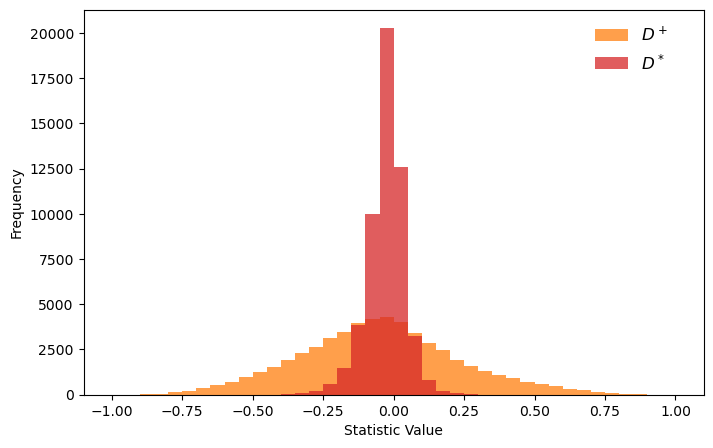

D+: Mean= -0.04986748024552127 Std. Dev.= 0.2843248956447245
D*: Mean= -0.027718641339090452 Std. Dev.= 0.06691099690851424


In [4]:
# Denisova Multiple lineages
df_dstar = pd.read_csv("dstar.tsv", sep="\t", skiprows=2, skipfooter=1, header=0)
df_dplus = pd.read_csv("dplus.tsv", sep="\t", skiprows=3, skipfooter=2, header=0)
df_dstar = df_dstar.dropna(subset=['DSTAR'])
df_dplus = df_dplus.dropna(subset=['D+'])
plt.figure(figsize=(8,5))
plt.hist(
    df_dplus["D+"], bins=np.arange(-1, 1.05, 0.05),
    histtype='stepfilled', color='tab:orange', alpha=0.75,
)
plt.hist(
    df_dstar["DSTAR"], bins=np.arange(-1, 1.05, 0.05),
    histtype='stepfilled', color='tab:red', alpha=0.75,
)
legend_elements = [
    Patch(facecolor='tab:orange', alpha=0.75, label=r'$D^+$'),
    Patch(facecolor='tab:red', alpha=0.75, label=r'$D^*$'),
]
plt.legend(
    handles=legend_elements, loc='center left',
    bbox_to_anchor=(0.8, 0.9), frameon=False,
    fontsize=12,
)
plt.xlabel("Statistic Value")
plt.ylabel("Frequency")
plt.savefig("denisova_merged.png", dpi=300)
plt.show()

print('D+: Mean=', np.mean(df_dplus["D+"]), 'Std. Dev.=', np.std(df_dplus["D+"]))
print('D*: Mean=', np.mean(df_dstar["DSTAR"]), 'Std. Dev.=', np.std(df_dstar["DSTAR"]))

In [5]:
import re
def parse_gtf(gtf_file):
    genes = []

    with open(gtf_file) as f:
        for line in f:
            if line.startswith("#"):
                continue

            cols = line.strip().split("\t")
            chrom, source, feature, start, end, score, strand, frame, attr = cols

            if feature != "gene":
                continue

            gene_name = re.search('gene_name "([^"]+)"', attr)
            if gene_name:
                gene_name = gene_name.group(1)
            else:
                gene_name = "NA"

            genes.append((chrom, int(start), int(end), gene_name))

    return pd.DataFrame(genes, columns=["Chromosome", "Start_Position", "End_Position", "Gene"])

gtf_genes = parse_gtf("gencode.v44.annotation.gtf")

def annotate_with_genes(coords):
    annotations = []

    for _, row in coords.iterrows():
        overlaps = gtf_genes[
            (gtf_genes["Chromosome"] == row["Chromosome"]) &
            (gtf_genes["Start_Position"] <= row["End_Position"]) &
            (gtf_genes["End_Position"] >= row["Start_Position"])
        ]
        overlaps = overlaps[~overlaps["Gene"].str.startswith("ENSG", na=False)]
        genes = ",".join(overlaps["Gene"].unique())
        annotations.append(genes if genes else None)

    coords["genes"] = annotations
    return coords

In [6]:
df_dstar_top = df_dstar[df_dstar['DSTAR'] >= df_dstar['DSTAR'].quantile(0.999)].loc[df_dstar["Num_Loci"] >= 10, ["#Block_Num", "Chromosome", "Start_Position", "End_Position", "Num_Loci", "DSTAR"]]
annotate_with_genes(df_dstar_top)
#for _, row in df_dstar_top.iterrows():
#    print(f"{row['Chromosome']}:{row['Start_Position']}-{row['End_Position']} & {row['DSTAR']}{" & " + (row['genes'] if pd.notna(row['genes']) else "None")} \\\\")

,#Block_Num,Chromosome,Start_Position,End_Position,Num_Loci,DSTAR,genes
2009,2010,chr1,100500127,100549923,135,0.281830,"CDC14A,GPR88"
4868,4869,chr2,15350020,15399910,187,0.402892,"NBAS,RPS26P18"
4869,4870,chr2,15400032,15449785,90,0.343970,NBAS
4870,4871,chr2,15450016,15499925,168,0.391287,NBAS
4871,4872,chr2,15500113,15549983,173,0.367268,NBAS
7120,7121,chr2,131300151,131349960,175,0.294214,"PLEKHB2,FAR2P4,KLF2P4,ARHGAP42P1"
7528,7529,chr2,151700003,151749947,128,0.277121,NEB
7529,7530,chr2,151750166,151800000,128,0.323337,ARL5A
8974,8975,chr2,224000182,224049908,225,0.257698,SERPINE2
10358,10359,chr3,51000035,51049848,107,0.377371,DOCK3


In [9]:
df_dplus_top = df_dplus[df_dplus['D+'] >= df_dplus['D+'].quantile(0.999)].loc[df_dplus["Num_Loci"] >= 10, ["#Block_Num", "Chromosome", "Start_Position", "End_Position", "Num_Loci", "D+"]]
annotate_with_genes(df_dplus_top)
for _, row in df_dplus_top.iterrows():
    print(f"{row['Chromosome']}:{row['Start_Position']}-{row['End_Position']} & {row['D+']}{" & " + (row['genes'] if pd.notna(row['genes']) else "None")} \\\\")

print()
print()
for _, row in df_dstar_top[~df_dstar_top['#Block_Num'].isin(df_dplus_top['#Block_Num'])].iterrows():
    print(f"{row['Chromosome']}:{row['Start_Position']}-{row['End_Position']} & {row['DSTAR']}{" & " + (row['genes'] if pd.notna(row['genes']) else "None")} \\\\")


chr2:13200289-13249928 & 0.836929 & None \\
chr2:15500113-15549983 & 0.827326 & NBAS \\
chr2:81500426-81549853 & 0.897342 & None \\
chr2:81550477-81599616 & 0.867145 & None \\
chr2:103500013-103549989 & 0.899182 & None \\
chr2:103550042-103599596 & 0.921937 & None \\
chr2:151750166-151800000 & 0.861246 & ARL5A \\
chr2:213600128-213649988 & 0.8334 & SPAG16 \\
chr3:51000035-51049848 & 0.853344 & DOCK3 \\
chr3:51050245-51099743 & 0.826569 & DOCK3 \\
chr3:69800121-69849828 & 0.8333 & MITF \\
chr3:71400504-71449831 & 0.839335 & FOXP1 \\
chr3:87750001-87799174 & 0.848428 & HTR1F \\
chr3:102250073-102299796 & 0.900797 & ZPLD1 \\
chr3:102300814-102349721 & 0.851154 & ZPLD1 \\
chr3:162800016-162849589 & 0.911989 & None \\
chr3:162850019-162899638 & 0.929786 & None \\
chr3:190250515-190299949 & 0.830981 & None \\
chr4:33250480-33299726 & 0.846526 & None \\
chr4:94350137-94399948 & 0.883656 & RPL35AP11 \\
chr4:101200011-101249635 & 0.84719 & PPP3CA,MIR8066 \\
chr4:102750310-102799902 & 0.839853 &

In [8]:
df_d_top = df_dplus[df_dplus['D'] >= df_dplus['D'].quantile(0.999)].loc[df_dplus["Num_Loci"] >= 10, ["#Block_Num", "Chromosome", "Start_Position", "End_Position", "Num_Loci", "D"]]
annotate_with_genes(df_d_top)

,#Block_Num,Chromosome,Start_Position,End_Position,Num_Loci,D,genes
19,20,chr1,1000018,1049997,502,1.0,"HES4,ISG15,AGRN"
29,30,chr1,1500144,1549967,614,1.0,"ATAD3A,TMEM240,SSU72"
504,505,chr1,25250501,25299929,464,1.0,"RSRP1,RHD,SDHDP6"
511,512,chr1,25600009,25649933,323,1.0,MAN1C1
547,548,chr1,27400007,27449924,222,1.0,WASF2
...,...,...,...,...,...,...,...
52726,52727,chr21,16500138,16549943,255,1.0,"MIR99AHG,MIR99A,MIRLET7C"
52851,52852,chr21,22750108,22799169,180,1.0,NaN
53562,53563,chr22,24350107,24399984,322,1.0,"SPECC1L,SPECC1L-ADORA2A"
53587,53588,chr22,25600107,25649736,313,1.0,"GRK3,YES1P1"


   #Block_Num Chromosome_x  Start_Position_x  End_Position_x  Num_Loci_x  \
0        4872         chr2          15500113        15549983         320   
1        7530         chr2         151750166       151800000         317   
2       10359         chr3          51000035        51049848         198   
3       10360         chr3          51050245        51099743         188   
4       13910         chr4          33250480        33299726         302   
5       17618         chr5          30500157        30549954         342   
6       29650         chr8         131300072       131349693         570   
7       30225         chr9          14950160        14999993         390   
8       33381        chr10          54250033        54299565         445   

         D+ genes_x Chromosome_y  Start_Position_y  End_Position_y  \
0  0.827326    NBAS         chr2          15500113        15549983   
1  0.861246   ARL5A         chr2         151750166       151800000   
2  0.853344   DOCK3         c

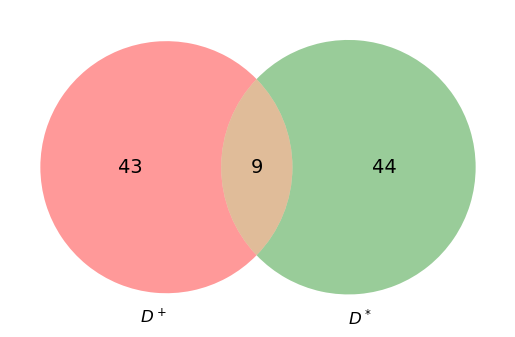

In [17]:
from matplotlib_venn import venn2
v = venn2([set(df_dplus_top['#Block_Num']), set(df_dstar_top['#Block_Num'])], set_labels=(r'$D^+$', r'$D^*$'))
for label in v.subset_labels:
    if label:
        label.set_fontsize(14)
print(pd.merge(df_dplus_top, df_dstar_top, on='#Block_Num', how='inner'))
plt.show()

/var/folders/_x/fdb_44853vx991yq8wrnpyv40000gn/T/ipykernel_5654/3647533424.py:1: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  df_dstar = pd.read_csv("subsample_2_2_dstar.tsv", sep="\t", skiprows=2, skipfooter=1, header=0)
/var/folders/_x/fdb_44853vx991yq8wrnpyv40000gn/T/ipykernel_5654/3647533424.py:2: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  df_dplus = pd.read_csv("subsample_2_2_dplus.tsv", sep="\t", skiprows=3, skipfooter=2, header=0)


   #Block_Num Chromosome_x  Start_Position_x  End_Position_x  Num_Loci_x  \
0        7530         chr2         151750166       151800000         290   

         D+ Chromosome_y  Start_Position_y  End_Position_y  Num_Loci_y  \
0  0.915108         chr2         151750166       151800000         116   

      DSTAR  
0  0.384067  


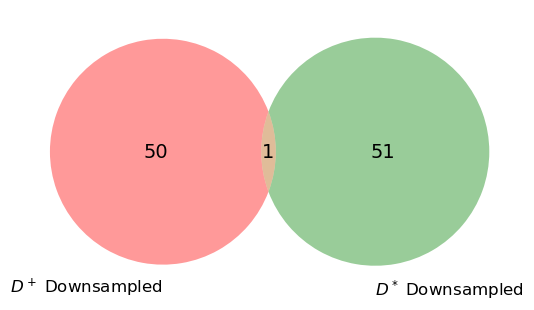

In [54]:
df_dstar = pd.read_csv("subsample_2_2_dstar.tsv", sep="\t", skiprows=2, skipfooter=1, header=0)
df_dplus = pd.read_csv("subsample_2_2_dplus.tsv", sep="\t", skiprows=3, skipfooter=2, header=0)
df_dstar = df_dstar.dropna(subset=['DSTAR'])
df_dplus = df_dplus.dropna(subset=['D+'])
df_dstar_top_unequal = df_dstar[df_dstar['DSTAR'] >= df_dstar['DSTAR'].quantile(0.999)].loc[df_dstar["Num_Loci"] >= 10, ["#Block_Num", "Chromosome", "Start_Position", "End_Position", "Num_Loci", "DSTAR"]]
df_dplus_top_unequal = df_dplus[df_dplus['D+'] >= df_dplus['D+'].quantile(0.999)].loc[df_dplus["Num_Loci"] >= 10, ["#Block_Num", "Chromosome", "Start_Position", "End_Position", "Num_Loci", "D+"]]
v = venn2([set(df_dplus_top_unequal['#Block_Num']), set(df_dstar_top_unequal['#Block_Num'])], set_labels=(r'$D^+$ Downsampled', r'$D^*$ Downsampled'))
for label in v.subset_labels:
    if label:
        label.set_fontsize(14)
print(pd.merge(df_dplus_top_unequal, df_dstar_top_unequal, on='#Block_Num', how='inner'))

    #Block_Num Chromosome_x  Start_Position_x  End_Position_x  Num_Loci_x  \
0         2010         chr1         100500127       100549923         135   
1         4869         chr2          15350020        15399910         187   
2         4870         chr2          15400032        15449785          90   
3         4871         chr2          15450016        15499925         168   
4         4872         chr2          15500113        15549983         173   
5         7121         chr2         131300151       131349960         175   
6         7529         chr2         151700003       151749947         128   
7         7530         chr2         151750166       151800000         128   
8        10359         chr3          51000035        51049848         107   
9        10360         chr3          51050245        51099743         101   
10       13580         chr4          16750069        16799774         100   
11       13911         chr4          33300092        33349849         188   

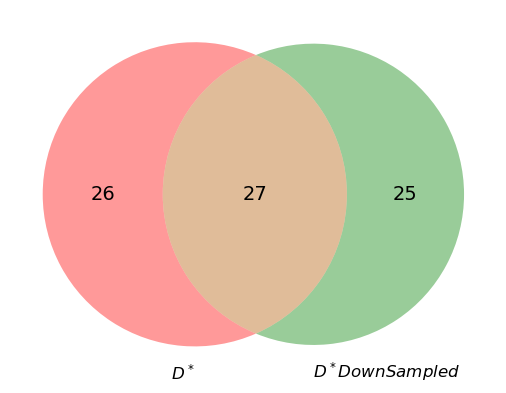

In [55]:
v = venn2([set(df_dstar_top['#Block_Num']), set(df_dstar_top_unequal['#Block_Num'])], set_labels=(r'$D^*$', r'$D^* DownSampled$'))
for label in v.subset_labels:
    if label:
        label.set_fontsize(14)
print(pd.merge(df_dstar_top, df_dstar_top_unequal, on='#Block_Num', how='inner'))

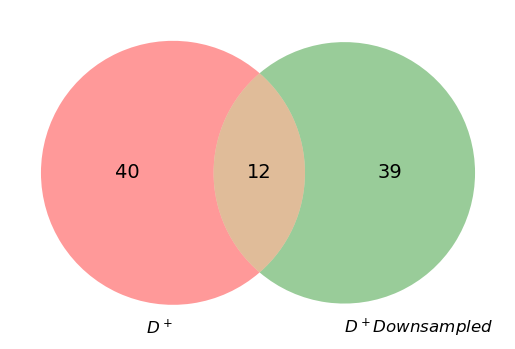

In [21]:
v = venn2([set(df_dplus_top['#Block_Num']), set(df_dplus_top_unequal['#Block_Num'])], set_labels=(r'$D^+$', r'$D^+ Downsampled$'))
for label in v.subset_labels:
    if label:
        label.set_fontsize(14)
#print(pd.merge(df_dplus_top, df_dplus_top_unequal, on='#Block_Num', how='inner'))

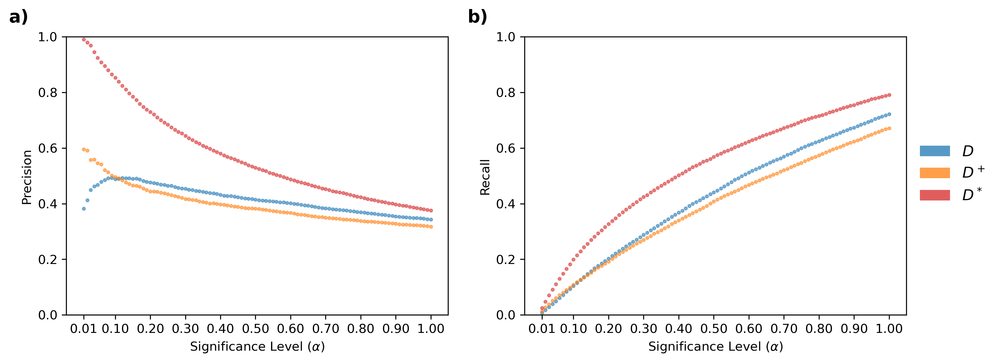

alpha	D		D+		D*
0.01	0.3818/0.0079	0.5956/0.0137	0.9899/0.0246
0.02	0.4127/0.0172	0.5912/0.0269	0.9795/0.0482
0.03	0.4498/0.0282	0.558/0.0381	0.9688/0.0703
0.04	0.4626/0.0389	0.5583/0.0505	0.945/0.0907
0.05	0.4673/0.0494	0.5457/0.0609	0.9241/0.1101



In [28]:
performance_results = load_performance(alphas, './resultsDStats')
performance_df = calc_performance_metrics(performance_results)

fig, axes = plt.subplots(
    1, 2, figsize=(12, 4), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

cond_wind = performance_df['wind_thresh'] == 0.1
cond_d = performance_df['stat'] == 'd'
cond_dplus = performance_df['stat'] == 'dplus'
cond_dstar = performance_df['stat'] == 'dstar'
axes[0].scatter(
    xs, performance_df[cond_wind & cond_d]['precision'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[0].scatter(
    xs, performance_df[cond_wind & cond_dplus]['precision'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[0].scatter(
    xs, performance_df[cond_wind & cond_dstar]['precision'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)

axes[1].scatter(
    xs, performance_df[cond_wind & cond_d]['recall'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[1].scatter(
    xs, performance_df[cond_wind & cond_dplus]['recall'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[1].scatter(
    xs, performance_df[cond_wind & cond_dstar]['recall'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)

axes[0].set_ylabel('Precision')
axes[1].set_ylabel('Recall')
axes[0].set_xlabel(r'Significance Level ($\alpha$)')
axes[1].set_xlabel(r'Significance Level ($\alpha$)')
axes[0].set_ylim(0, 1)
axes[1].set_ylim(0, 1)
axes[0].set_xticks(x_ticks)
axes[1].set_xticks(x_ticks)
legend_elements = [
    Patch(facecolor='tab:blue', alpha=0.75, label=r'$D$'),
    Patch(facecolor='tab:orange', alpha=0.75, label=r'$D^+$'),
    Patch(facecolor='tab:red', alpha=0.75, label=r'$D^*$')
]
fig.legend(
    handles=legend_elements, loc='center left',
    bbox_to_anchor=(0.9, 0.5), frameon=False,
    fontsize=12,
)
for ax, label in zip(axes.flat, ['a)', 'b)']):
    ax.text(
        -0.15, 1.1, label,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )
# Show the plot.
plt.savefig("dstar_hmmix.png", dpi=300)
plt.show()
print_precision_recall(performance_df)

In [30]:
from sklearn.metrics import confusion_matrix

WINDOW = 50_000
THRESH = 0.1

def overlap_1based(a_start, a_end, b_start, b_end):
    """
    1-based inclusive overlap
    """
    return max(0, min(a_end, b_end) - max(a_start, b_start) + 1)

hmmix = {}
hmmix['TP'] = 0
hmmix['TN'] = 0
hmmix['FP'] = 0
hmmix['FN'] = 0

for rep in range(1, 101):
    print("Rep", rep)
    df = pd.read_csv(f"decoded/decoded_rep{rep}.P2_0.diploid.txt", sep=r"\s+")
    gt = pd.read_csv(f"resultsDStats/rep{rep}_overlap.csv")

    archaic = df[df["state"] == "Archaic"].copy()

    results = []

    for chrom, chrom_df in df.groupby("chrom"):
        max_pos = chrom_df["end"].max()
    
        for w_start in range(1, max_pos + 1, WINDOW):
            # 1-based window end is inclusive
            w_end = min(w_start + WINDOW - 1, max_pos)
    
            window_len = w_end - w_start + 1
    
            overlap_len = 0
    
            for _, row in archaic[archaic["chrom"] == chrom].iterrows():
                overlap_len += overlap_1based(
                    w_start, w_end,
                    row["start"], row["end"]
                )
    
            frac = overlap_len / window_len if window_len > 0 else 0
    
            label = "Archaic" if frac >= THRESH else "Human"
    
            results.append([chrom, w_start, w_end, frac, label])
    
    out = pd.DataFrame(results, columns=[
        "chrom", "start", "end", "archaic_fraction", "label"
    ])

    # convert to binary label
    gt["true_label"] = gt["overlap_pc"] >= 0.1
    
    # convert predictions to binary label
    # adjust if your label column differs
    out["pred_label"] = out["label"] == "Archaic"
    
    # align rows by index (since GT uses 0..N indexing)
    y_true = gt["true_label"].astype(int)
    y_pred = out["pred_label"].astype(int)
    
    # confusion matrix: TN, FP, FN, TP
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()
    hmmix['TP'] += tp
    hmmix['TN'] += tn
    hmmix['FP'] += fp
    hmmix['FN'] += fn

print(hmmix)

precision = hmmix['TP'] / (hmmix['TP'] + hmmix['FP'])
recall = hmmix['TP'] / (hmmix['TP'] + hmmix['FN']) 

print("Precision:", precision)
print("Recall:", recall)

Rep 1
Rep 2
Rep 3
Rep 4
Rep 5
Rep 6
Rep 7
Rep 8
Rep 9
Rep 10
Rep 11
Rep 12
Rep 13
Rep 14
Rep 15
Rep 16
Rep 17
Rep 18
Rep 19
Rep 20
Rep 21
Rep 22
Rep 23
Rep 24
Rep 25
Rep 26
Rep 27
Rep 28
Rep 29
Rep 30
Rep 31
Rep 32
Rep 33
Rep 34
Rep 35
Rep 36
Rep 37
Rep 38
Rep 39
Rep 40
Rep 41
Rep 42
Rep 43
Rep 44
Rep 45
Rep 46
Rep 47
Rep 48
Rep 49
Rep 50
Rep 51
Rep 52
Rep 53
Rep 54
Rep 55
Rep 56
Rep 57
Rep 58
Rep 59
Rep 60
Rep 61
Rep 62
Rep 63
Rep 64
Rep 65
Rep 66
Rep 67
Rep 68
Rep 69
Rep 70
Rep 71
Rep 72
Rep 73
Rep 74
Rep 75
Rep 76
Rep 77
Rep 78
Rep 79
Rep 80
Rep 81
Rep 82
Rep 83
Rep 84
Rep 85
Rep 86
Rep 87
Rep 88
Rep 89
Rep 90
Rep 91
Rep 92
Rep 93
Rep 94
Rep 95
Rep 96
Rep 97
Rep 98
Rep 99
Rep 100
{'TP': np.int64(4720), 'TN': np.int64(21444), 'FP': np.int64(10603), 'FN': np.int64(3233)}
Precision: 0.3080336748678457
Recall: 0.5934867345655728


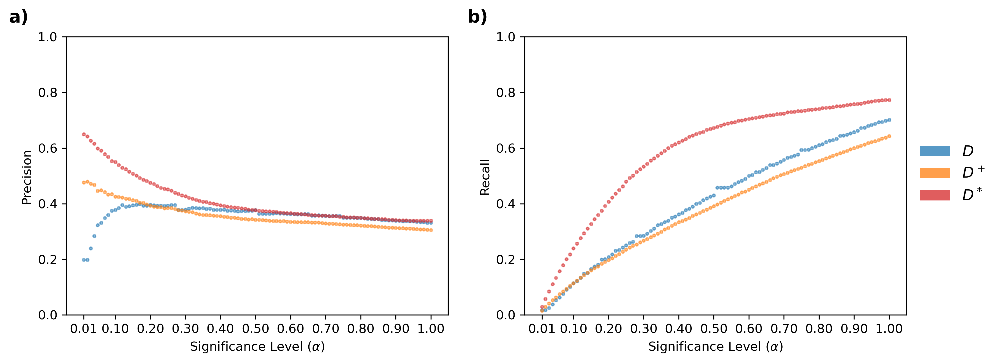

alpha	D		D+		D*
0.01	0.1986/0.0179	0.4767/0.0155	0.6497/0.0289
0.02	0.1986/0.0179	0.4796/0.0295	0.6416/0.0578
0.03	0.2388/0.0249	0.4724/0.0409	0.6273/0.0842
0.04	0.284/0.0381	0.4682/0.0537	0.6159/0.1109
0.05	0.3227/0.0532	0.4461/0.063	0.5986/0.1332



In [27]:
performance_results = load_performance(alphas, './resultsDStats2')
performance_df = calc_performance_metrics(performance_results)

fig, axes = plt.subplots(
    1, 2, figsize=(12, 4), dpi=300.0,
    sharex=False, sharey=False, facecolor='white'
)

cond_wind = performance_df['wind_thresh'] == 0.1
cond_d = performance_df['stat'] == 'd'
cond_dplus = performance_df['stat'] == 'dplus'
cond_dstar = performance_df['stat'] == 'dstar'
axes[0].scatter(
    xs, performance_df[cond_wind & cond_d]['precision'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[0].scatter(
    xs, performance_df[cond_wind & cond_dplus]['precision'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[0].scatter(
    xs, performance_df[cond_wind & cond_dstar]['precision'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)

axes[1].scatter(
    xs, performance_df[cond_wind & cond_d]['recall'].values,
    marker='o', s=5, color='tab:blue', alpha=0.5,
)
axes[1].scatter(
    xs, performance_df[cond_wind & cond_dplus]['recall'].values,
    marker='o', s=5, color='tab:orange', alpha=0.5,
)
axes[1].scatter(
    xs, performance_df[cond_wind & cond_dstar]['recall'].values,
    marker='o', s=5, color='tab:red', alpha=0.5,
)

axes[0].set_ylabel('Precision')
axes[1].set_ylabel('Recall')
axes[0].set_xlabel(r'Significance Level ($\alpha$)')
axes[1].set_xlabel(r'Significance Level ($\alpha$)')
axes[0].set_ylim(0, 1)
axes[1].set_ylim(0, 1)
axes[0].set_xticks(x_ticks)
axes[1].set_xticks(x_ticks)
legend_elements = [
    Patch(facecolor='tab:blue', alpha=0.75, label=r'$D$'),
    Patch(facecolor='tab:orange', alpha=0.75, label=r'$D^+$'),
    Patch(facecolor='tab:red', alpha=0.75, label=r'$D^*$')
]
fig.legend(
    handles=legend_elements, loc='center left',
    bbox_to_anchor=(0.9, 0.5), frameon=False,
    fontsize=12,
)
for ax, label in zip(axes.flat, ['a)', 'b)']):
    ax.text(
        -0.15, 1.1, label,
        transform=ax.transAxes,
        fontsize=14,
        fontweight='bold',
        va='top',
        ha='left'
    )
# Show the plot.
plt.savefig("dstar_hmmix2.png", dpi=300)
plt.show()
print_precision_recall(performance_df)

In [2]:
from sklearn.metrics import confusion_matrix

WINDOW = 50_000
THRESH = 0.5

def overlap_1based(a_start, a_end, b_start, b_end):
    """
    1-based inclusive overlap
    """
    return max(0, min(a_end, b_end) - max(a_start, b_start) + 1)

hmmix = {}
hmmix['TP'] = 0
hmmix['TN'] = 0
hmmix['FP'] = 0
hmmix['FN'] = 0

for rep in range(1, 101):
    print("Processed Rep", rep)
    df = pd.read_csv(f"decoded2/decoded_rep{rep}.P2_0.diploid.txt", sep=r"\s+")
    gt = pd.read_csv(f"resultsDStats2/rep{rep}_overlap.csv")

    archaic = df[df["state"] == "Archaic"].copy()

    results = []

    for chrom, chrom_df in df.groupby("chrom"):
        max_pos = chrom_df["end"].max()
    
        for w_start in range(1, max_pos + 1, WINDOW):
            # 1-based window end is inclusive
            w_end = min(w_start + WINDOW - 1, max_pos)
    
            window_len = w_end - w_start + 1
    
            overlap_len = 0
    
            for _, row in archaic[archaic["chrom"] == chrom].iterrows():
                overlap_len += overlap_1based(
                    w_start, w_end,
                    row["start"], row["end"]
                )
    
            frac = overlap_len / window_len if window_len > 0 else 0
    
            label = "Archaic" if frac >= THRESH else "Human"
    
            results.append([chrom, w_start, w_end, frac, label])
    
    out = pd.DataFrame(results, columns=[
        "chrom", "start", "end", "archaic_fraction", "label"
    ])

    # convert to binary label
    gt["true_label"] = gt["overlap_pc"] >= 0.5
    
    # convert predictions to binary label
    # adjust if your label column differs
    out["pred_label"] = out["label"] == "Archaic"
    
    # align rows by index (since GT uses 0..N indexing)
    y_true = gt["true_label"].astype(int)
    y_pred = out["pred_label"].astype(int)
    
    # confusion matrix: TN, FP, FN, TP
    cm = confusion_matrix(y_true, y_pred)
    tn, fp, fn, tp = cm.ravel()
    hmmix['TP'] += tp
    hmmix['TN'] += tn
    hmmix['FP'] += fp
    hmmix['FN'] += fn

print(hmmix)

precision = hmmix['TP'] / (hmmix['TP'] + hmmix['FP']) 
recall = hmmix['TP'] / (hmmix['TP'] + hmmix['FN'])

print("Precision:", precision)
print("Recall:", recall)

Processed Rep 1
Processed Rep 2
Processed Rep 3
Processed Rep 4
Processed Rep 5
Processed Rep 6
Processed Rep 7
Processed Rep 8
Processed Rep 9
Processed Rep 10
Processed Rep 11
Processed Rep 12
Processed Rep 13
Processed Rep 14
Processed Rep 15
Processed Rep 16
Processed Rep 17
Processed Rep 18
Processed Rep 19
Processed Rep 20
Processed Rep 21
Processed Rep 22
Processed Rep 23
Processed Rep 24
Processed Rep 25
Processed Rep 26
Processed Rep 27
Processed Rep 28
Processed Rep 29
Processed Rep 30
Processed Rep 31
Processed Rep 32
Processed Rep 33
Processed Rep 34
Processed Rep 35
Processed Rep 36
Processed Rep 37
Processed Rep 38
Processed Rep 39
Processed Rep 40
Processed Rep 41
Processed Rep 42
Processed Rep 43
Processed Rep 44
Processed Rep 45
Processed Rep 46
Processed Rep 47
Processed Rep 48
Processed Rep 49
Processed Rep 50
Processed Rep 51
Processed Rep 52
Processed Rep 53
Processed Rep 54
Processed Rep 55
Processed Rep 56
Processed Rep 57
Processed Rep 58
Processed Rep 59
Proces